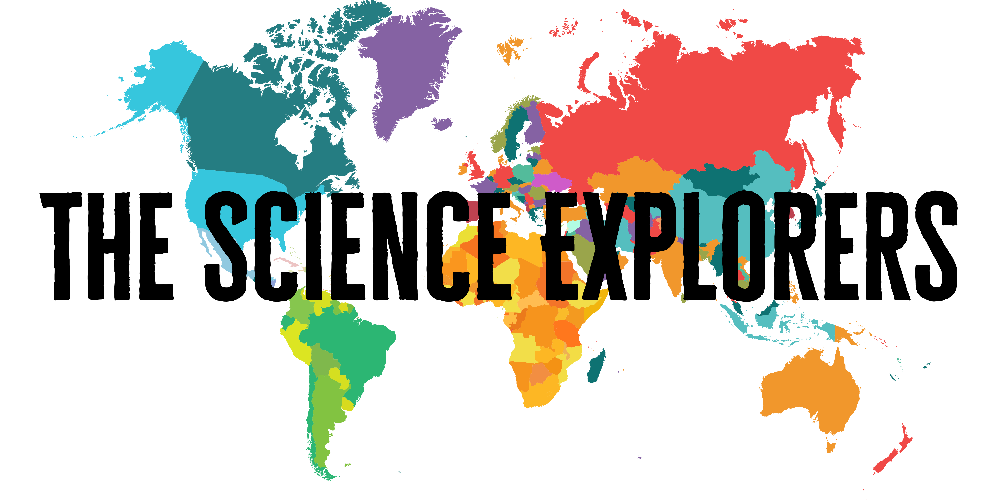

# The Science Explorers: Exploring Earthquakes
## Melissa Gonzalez, Borly Green, and Jessenia Lorenzo
---------------------
##### DSO110 Final Project
##### October/November 2021
---
## Summary
The objective of this project would be to detect earthquake patterns. The primary objective is to find out if the frequency of earthquakes have any correlation with a season. An earthquake season definition should be similar to what it is used to define hurricane season or tornado season. There will be 4 seasons; fall, winter, spring, and summer, and will rely on date ranges and latitude to calculate the season that previous earthquake events have occured in. We will also observe how the magnitude is impacted. We will also divide and look at data from earthquakes on land v. in the oceans, and will conclude by looking at tectonic plate boundaries to see if there is any correlation there and also visualize impacts from tsunamis created by earthquakes.

---

## Background
Earthquakes are a movement of the ground from a sudden slip on a tectonic fault line. Earthquakes occur all over the world, though they occur most frequently along the Ring of Fire around the Pacific Ocean. Earthquakes are classified by their magnitude and are measured with data measured by seismometers. The Magnitude of each earthquake is based on a logarithmic scale, where each whole number increase in the scale represents a tenfold increase in measured amplitude (USGS [Earthquake Magnitude, Energy Release, and Shaking Intensity](https://www.usgs.gov/natural-hazards/earthquake-hazards/science/earthquake-magnitude-energy-release-and-shaking-intensity?qt-science_center_objects=0#qt-science_center_objects)). This logarithmic scale means that an earthquake measured as a 7 is going to be 10 times more intense than an earthquake measured as a 6 magnitude. And the damage resulting from a magnitude 7 earthquake will be significantly more severe than that of a magnitude 6 earthquake. 

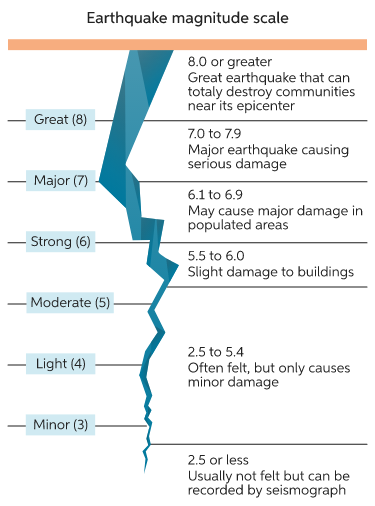

Because of the damage that is often caused from earthquakes, a lot of resources have been allocated to detection and gathering data from earthquakes. USGS has gathered data from major earthquakes, with a magnitude of 5.5 and above between the years 1967 and 2015 and listed data related to date, time, location, depth, and magnitude.

While local weather has not been shown to be connected to the frequency of earthquakes, the amount of groundwater change in areas along faults has been previously associated with occurrence of earthquakes (NASA, [Can Climate Affect Earthquakes, Or Are the Connections Shaky? – Climate Change: Vital Signs of the Planet](https://climate.nasa.gov/news/2926/can-climate-affect-earthquakes-or-are-the-connections-shaky/)). Because season is also related to the amount of groundwater, there is interest in if either the frequency or magnitude of earthquakes are impacted by the season.

---
## Data

Data was collected from five difference sources as follows:
+ United States Geological Survey (USGS)
    + Significant Earthquakes 1965 - 2016
         + https://www.kaggle.com/usgs/earthquake-database
    + Google Earth Tectonic Plate Boundaries
         + https://www.usgs.gov/media/files/plate-boundaries-kmz-file
+ Department of Geoscience - University of Wisconsin - Madison
    + Tectonic Plate Boundaries file
        + https://www.kaggle.com/cwthompson/tectonic-plate-boundaries
+ Incorporated Research Institutions for Seismology (IRIS)
    + Database of Global Seismometer Monitoring Locations
        + http://www.iris.washington.edu/gmap/#network=_REALTIME&plates=on&planet=earth
+ Natural Earth Data
    + Earth Shapefile
        + https://www.naturalearthdata.com/downloads/110m-physical-vectors/110m-ocean/

---
## Methods
Both R and Python were used to wrangle, analyse, and visualize data. In addition, Google Earth was used for visualizations, a .kml calculator was used to calculate distances of particular plates, and QGIS was used to join data point locations to the nearest plate boundary. Tableau was used for visualizations and some analysis.

---

### Setup

In [2]:
options(warn=-1) #to suppress warnings
library('tidyverse')
library('data.table')
library('dplyr')
library('IDPmisc')
library('tidyr')
library('mvnormtest') #for MANOVA
library('car') # for test of homogeneity of variance
library('rcompanion') # for plotting normality of histograms
library('caret') # linear regressions
library('gvlma')
library('predictmeans')
library('e1071')
library('lmtest')
library('readxl')
library('geosphere')
library('rgeos')
library('tmap')
library('sf') #to read xml/kml/xsd files
library('sp') # to categorize and quanitify points over land v. water
library('rgdal')
require('maptools')
library('readxl')# read in xlsx
library('sandwich')
library('msm')
library('readr')# to read text file with data station information
library('xlsx') #to write in xlsx
library('IRdisplay')
library('base64enc')

---
#### Import Data 'Significant Earthquakes' Dataset

In [3]:
database <- read.csv("/Users/gonzalezfamily/Documents/GitHub/FinalProject2021/Data/database 2.csv")
head(database)

,Date,Time,Latitude,Longitude,Type,Depth,Depth.Error,Depth.Seismic.Stations,Magnitude,Magnitude.Type,⋯,Magnitude.Seismic.Stations,Azimuthal.Gap,Horizontal.Distance,Horizontal.Error,Root.Mean.Square,ID,Source,Location.Source,Magnitude.Source,Status
,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<int>,<dbl>,<chr>,⋯,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>
1,01/02/1965,13:44:18,19.246,145.616,Earthquake,131.6,NA,NA,6.0,MW,⋯,NA,NA,NA,NA,NA,ISCGEM860706,ISCGEM,ISCGEM,ISCGEM,Automatic
2,01/04/1965,11:29:49,1.863,127.352,Earthquake,80.0,NA,NA,5.8,MW,⋯,NA,NA,NA,NA,NA,ISCGEM860737,ISCGEM,ISCGEM,ISCGEM,Automatic
3,01/05/1965,18:05:58,-20.579,-173.972,Earthquake,20.0,NA,NA,6.2,MW,⋯,NA,NA,NA,NA,NA,ISCGEM860762,ISCGEM,ISCGEM,ISCGEM,Automatic
4,01/08/1965,18:49:43,-59.076,-23.557,Earthquake,15.0,NA,NA,5.8,MW,⋯,NA,NA,NA,NA,NA,ISCGEM860856,ISCGEM,ISCGEM,ISCGEM,Automatic
5,01/09/1965,13:32:50,11.938,126.427,Earthquake,15.0,NA,NA,5.8,MW,⋯,NA,NA,NA,NA,NA,ISCGEM860890,ISCGEM,ISCGEM,ISCGEM,Automatic
6,01/10/1965,13:36:32,-13.405,166.629,Earthquake,35.0,NA,NA,6.7,MW,⋯,NA,NA,NA,NA,NA,ISCGEM860922,ISCGEM,ISCGEM,ISCGEM,Automatic


# Questions
##### 1) Does season have any impact on either the frequency of earthquakes or the magnitude of earthquakes?
+ IV - Season
+ DV1 - Frequency
+ DV2 - Magnitude
    
### Wrangling Data
##### Subset
+ Include only Date, Time, Latitude, Longitude, Type, Depth, Magnitude, and ID

In [4]:
earthquakes <- database[c("Date", "Time", "Latitude", "Longitude", "Type", "Depth", "Magnitude", "ID")]
head(earthquakes)

,Date,Time,Latitude,Longitude,Type,Depth,Magnitude,ID
,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<chr>
1,01/02/1965,13:44:18,19.246,145.616,Earthquake,131.6,6.0,ISCGEM860706
2,01/04/1965,11:29:49,1.863,127.352,Earthquake,80.0,5.8,ISCGEM860737
3,01/05/1965,18:05:58,-20.579,-173.972,Earthquake,20.0,6.2,ISCGEM860762
4,01/08/1965,18:49:43,-59.076,-23.557,Earthquake,15.0,5.8,ISCGEM860856
5,01/09/1965,13:32:50,11.938,126.427,Earthquake,15.0,5.8,ISCGEM860890
6,01/10/1965,13:36:32,-13.405,166.629,Earthquake,35.0,6.7,ISCGEM860922


##### Get an overview of columns and data types

In [68]:
str(earthquakes)

'data.frame':	23412 obs. of  14 variables:
 $ Date      : Date, format: "1965-01-02" "1965-01-04" ...
 $ Time      : chr  "13:44:18" "11:29:49" "18:05:58" "18:49:43" ...
 $ Latitude  : num  19.25 1.86 -20.58 -59.08 11.94 ...
 $ Longitude : num  145.6 127.4 -174 -23.6 126.4 ...
 $ Type      : chr  "Earthquake" "Earthquake" "Earthquake" "Earthquake" ...
 $ Depth     : num  132 80 20 15 15 ...
 $ Magnitude : num  6 5.8 6.2 5.8 5.8 6.7 5.9 6 6 5.8 ...
 $ ID        : chr  "ISCGEM860706" "ISCGEM860737" "ISCGEM860762" "ISCGEM860856" ...
 $ MonthDay  : chr  "01/02" "01/04" "01/05" "01/08" ...
 $ Hemisphere: chr  "Tropics" "Tropics" "Tropics" "Southern" ...
 $ TropicZone: chr  "Tropic of Cancer" "Tropic of Cancer" "Tropic of Capricorn" "Southern" ...
 $ Season    : chr  "Tropical" "Tropical" "Tropical" "Summer" ...
 $ Count     : num  1 1 1 1 1 1 1 1 1 1 ...
 $ LandSea   : logi  TRUE TRUE TRUE TRUE TRUE TRUE ...


##### Convert Date column from 'character' to 'date'

In [6]:
earthquakes$Date <- as.Date(earthquakes$Date, format = "%m/%d/%Y")
str(earthquakes)

'data.frame':	23412 obs. of  8 variables:
 $ Date     : Date, format: "1965-01-02" "1965-01-04" ...
 $ Time     : chr  "13:44:18" "11:29:49" "18:05:58" "18:49:43" ...
 $ Latitude : num  19.25 1.86 -20.58 -59.08 11.94 ...
 $ Longitude: num  145.6 127.4 -174 -23.6 126.4 ...
 $ Type     : chr  "Earthquake" "Earthquake" "Earthquake" "Earthquake" ...
 $ Depth    : num  132 80 20 15 15 ...
 $ Magnitude: num  6 5.8 6.2 5.8 5.8 6.7 5.9 6 6 5.8 ...
 $ ID       : chr  "ISCGEM860706" "ISCGEM860737" "ISCGEM860762" "ISCGEM860856" ...


##### Create new column with just Month and Day

In [7]:
earthquakes$MonthDay <- format(earthquakes$Date, format = "%m/%d" )

##### Assign Northern/Southern Hemisphere
+ Hemispheres
    + Northern Hemisphere >  23.5
    + Southern Hemisphere < -23.5

In [8]:
earthquakes$Hemisphere <- ifelse(earthquakes$Latitude >= 23.5, "Northern",
                     ifelse(earthquakes$Latitude <= -23.5, "Southern", "Tropics"))
head(earthquakes)

,Date,Time,Latitude,Longitude,Type,Depth,Magnitude,ID,MonthDay,Hemisphere
,<date>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1,1965-01-02,13:44:18,19.246,145.616,Earthquake,131.6,6.0,ISCGEM860706,01/02,Tropics
2,1965-01-04,11:29:49,1.863,127.352,Earthquake,80.0,5.8,ISCGEM860737,01/04,Tropics
3,1965-01-05,18:05:58,-20.579,-173.972,Earthquake,20.0,6.2,ISCGEM860762,01/05,Tropics
4,1965-01-08,18:49:43,-59.076,-23.557,Earthquake,15.0,5.8,ISCGEM860856,01/08,Southern
5,1965-01-09,13:32:50,11.938,126.427,Earthquake,15.0,5.8,ISCGEM860890,01/09,Tropics
6,1965-01-10,13:36:32,-13.405,166.629,Earthquake,35.0,6.7,ISCGEM860922,01/10,Tropics


##### Assign New Column to show more detail in relation to equator and tropics of capricorn and cancer

In [9]:
earthquakes$TropicZone <- ifelse(earthquakes$Latitude >= 23.5, "Northern",
                                 ifelse(earthquakes$Latitude <= -23.5, "Southern",
                                        ifelse(earthquakes$Latitude > 0 & earthquakes$Latitude < 23.5, "Tropic of Cancer",
                                               ifelse(earthquakes$Latitude < 0 & earthquakes$Latitude > -23.5, "Tropic of Capricorn", 
                                                      ifelse(earthquakes$Latitude == 0 , "Equator", "Error")))))

##### Just to make sure that all data points were calculated correctly

In [10]:
unique(earthquakes$TropicZone)

[1] "Tropic of Cancer"    "Tropic of Capricorn" "Southern"           
[4] "Northern"            "Equator"

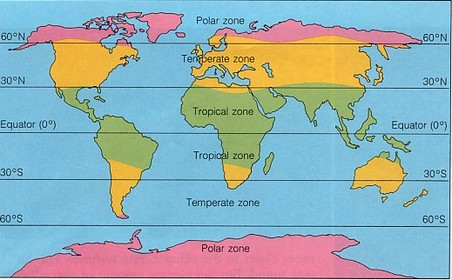

##### Assign MonthDay to Season

+ Seasons
    + Fall(NH)/Spring(SH):    Sept 21  - Dec 20
    + Winter(NH)/Summer(SH):  Dec 21   - March 20
    + Spring(NH)/Fall(SH):    March 21 - June 20
    + Summer(NH)/Winter:      June 21 - Sept 20

In [11]:
earthquakes$Season <- ifelse(
  earthquakes$Hemisphere == "Northern" & earthquakes$MonthDay >= "09/21" & earthquakes$MonthDay <= "12/20", "Fall",
  ifelse(
    earthquakes$Hemisphere == "Northern" & earthquakes$MonthDay >= "12/21" & earthquakes$MonthDay <= "12/31", "Winter", 
    ifelse(
      earthquakes$Hemisphere == "Northern" & earthquakes$MonthDay >= "01/01" & earthquakes$MonthDay <= "03/20", "Winter", 
      ifelse(
        earthquakes$Hemisphere == "Northern" & earthquakes$MonthDay >= "03/21" & earthquakes$MonthDay <= "06/20", "Spring", 
        ifelse(
          earthquakes$Hemisphere == "Northern" & earthquakes$MonthDay >= "06/21" & earthquakes$MonthDay <= "09/20", "Summer", 
          ifelse(
            earthquakes$Hemisphere == "Southern" & earthquakes$MonthDay >= "09/21" & earthquakes$MonthDay <= "12/20", "Spring",
            ifelse(
              earthquakes$Hemisphere == "Southern" & earthquakes$MonthDay >= "12/21" & earthquakes$MonthDay <= "12/31", "Summer",
              ifelse(
                earthquakes$Hemisphere == "Southern" & earthquakes$MonthDay >= "01/01" & earthquakes$MonthDay <= "03/20", "Summer",
                ifelse(
                  earthquakes$Hemisphere == "Southern" & earthquakes$MonthDay >= "03/21" & earthquakes$MonthDay <= "06/20", "Fall",
                  ifelse(
                    earthquakes$Hemisphere == "Southern" & earthquakes$MonthDay >= "06/21" & earthquakes$MonthDay <= "09/20", "Winter",
                    "Tropical"))))))))))
head(earthquakes)

,Date,Time,Latitude,Longitude,Type,Depth,Magnitude,ID,MonthDay,Hemisphere,TropicZone,Season
,<date>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>
1,1965-01-02,13:44:18,19.246,145.616,Earthquake,131.6,6.0,ISCGEM860706,01/02,Tropics,Tropic of Cancer,Tropical
2,1965-01-04,11:29:49,1.863,127.352,Earthquake,80.0,5.8,ISCGEM860737,01/04,Tropics,Tropic of Cancer,Tropical
3,1965-01-05,18:05:58,-20.579,-173.972,Earthquake,20.0,6.2,ISCGEM860762,01/05,Tropics,Tropic of Capricorn,Tropical
4,1965-01-08,18:49:43,-59.076,-23.557,Earthquake,15.0,5.8,ISCGEM860856,01/08,Southern,Southern,Summer
5,1965-01-09,13:32:50,11.938,126.427,Earthquake,15.0,5.8,ISCGEM860890,01/09,Tropics,Tropic of Cancer,Tropical
6,1965-01-10,13:36:32,-13.405,166.629,Earthquake,35.0,6.7,ISCGEM860922,01/10,Tropics,Tropic of Capricorn,Tropical


##### To exclude tropical data (that does not have the same seasonal changes)

In [12]:
NSearthquakes <- earthquakes[earthquakes$Hemisphere != "Tropics",]
head(NSearthquakes)

,Date,Time,Latitude,Longitude,Type,Depth,Magnitude,ID,MonthDay,Hemisphere,TropicZone,Season
,<date>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>
4,1965-01-08,18:49:43,-59.076,-23.557,Earthquake,15,5.8,ISCGEM860856,01/08,Southern,Southern,Summer
7,1965-01-12,13:32:25,27.357,87.867,Earthquake,20,5.9,ISCGEM861007,01/12,Northern,Northern,Winter
9,1965-01-16,11:32:37,-56.452,-27.043,Earthquake,95,6.0,ISCGEMSUP861125,01/16,Southern,Southern,Summer
10,1965-01-17,10:43:17,-24.563,178.487,Earthquake,565,5.8,ISCGEM861148,01/17,Southern,Southern,Summer
13,1965-01-29,09:35:30,54.636,161.703,Earthquake,55,5.5,ISCGEM861461,01/29,Northern,Northern,Winter
15,1965-02-02,15:56:51,37.523,73.251,Earthquake,15,6.0,ISCGEM859164,02/02,Northern,Northern,Winter


##### Recode 'Season' to be numeric

In [13]:
NSearthquakes$SeasonR[NSearthquakes$Season == "Winter"] <- 0
NSearthquakes$SeasonR[NSearthquakes$Season == "Spring"] <- 1
NSearthquakes$SeasonR[NSearthquakes$Season == "Summer"] <- 2
NSearthquakes$SeasonR[NSearthquakes$Season == "Fall"] <- 3

##### Total Count of Earthquake Data in Seasonal (Non-tropical) Areas

In [14]:
n_distinct(NSearthquakes$ID)

[1] 10369

##### Count of earthquakes by Season

In [15]:
NSearthquakes %>% group_by(Season) %>% summarize(count = n())

Season,count
<chr>,<int>
Fall,2551
Spring,2640
Summer,2554
Winter,2622
NA,2


##### Remove N/As

In [16]:
NSearthquakes <-na.omit(NSearthquakes, c("Season"))

In [17]:
NSearthquakes %>% group_by(Season) %>% summarize(count = n())

Season,count
<chr>,<int>
Fall,2551
Spring,2640
Summer,2554
Winter,2622


##### Set new column for counts for future analysis

In [18]:
NSearthquakes$Count <- 1
earthquakes$Count <- 1

##### Export wrangled data frames for use in Tableau, Python, Google Earth, and QGIS

In [19]:
write.csv(NSearthquakes, "~/Documents/GitHub/FinalProject2021/Data/NSearthquakes.csv")
write.csv(earthquakes, "~/Documents/GitHub/FinalProject2021/Data/earthquakes.csv")

##### Frequency
##### ChiSquare to see if frequency is different than expected
+ H0 = Frequency of each season is the same
+ Ha = Frequency of each season is not the same

In [20]:
ObservedBySeason = c(2551, 2640, 2554, 2622)
HOBySeason = c(.25, .25, .25, .25)
chisq.test(x = ObservedBySeason, p = HOBySeason)


	Chi-squared test for given probabilities

data:  ObservedBySeason
X-squared = 2.4419, df = 3, p-value = 0.4859


+ p-values is > 0.05, so we cannot reject the null hypothesis
+ There is no statistical significance between the frequencies of earthquakes in each season.
___
##### Magnitude
##### ChiSquare to see if magnitude is different than expected
+ H0 = Average magnitude of each season is the same
+ Ha = Average magnitude of each season is not the same

In [21]:
EarthquakeSeasonMagnitude <- aggregate(Magnitude ~ Season, NSearthquakes, mean)
View(EarthquakeSeasonMagnitude)

Season,Magnitude
<chr>,<dbl>
Fall,5.875806
Spring,5.883212
Summer,5.886911
Winter,5.871922


In [22]:
ObservedMagnitudeSeason <- c(5.88, 5.88, 5.89, 5.87)
ExpectedNullMagnitudeSeason <- c(.25, .25, .25, .25)
chisq.test( x = ObservedMagnitudeSeason, p = ExpectedNullMagnitudeSeason)


	Chi-squared test for given probabilities

data:  ObservedMagnitudeSeason
X-squared = 3.4014e-05, df = 3, p-value = 1


+ p-values is >0.05, so we cannot reject the null hypothesis
+ There is not statistical significance between the average measured magnitudes of each season.
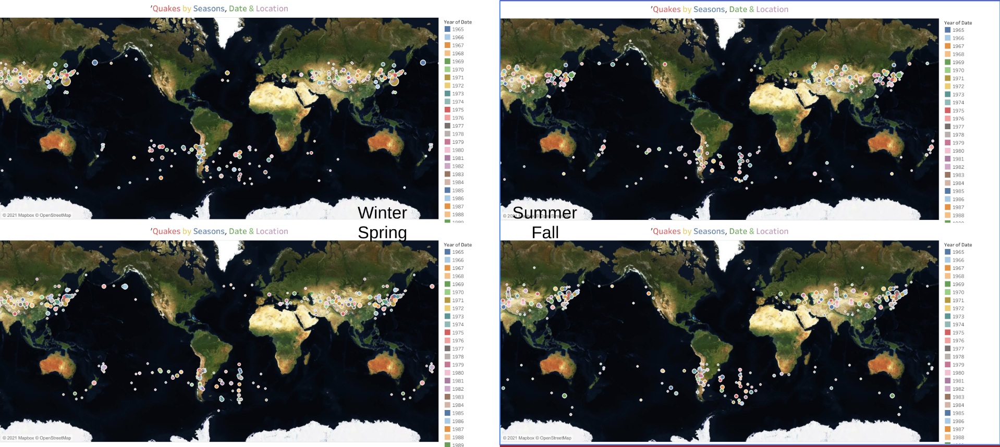

As there is no significant difference between the seasons in regards to frequency or magnitude, we will contintue to explore other areas of the data.

---
##### 2) Are there more earthquakes in land or ocean locations?
+ Function edited from: https://stackoverflow.com/questions/23459900/rmetrics-test-if-longitude-and-latitude-coordinates-are-on-land-or-sea
+ Oceans shapefile from Natural Earth Data: https://www.naturalearthdata.com/downloads/110m-physical-vectors/  Oceans

##### Quantify if each earthquake event happened over land or water

In [23]:
point.in.SpatialPolygons = function(point.x, point.y, SpP){
  X = slot(SpP,"polygons")
  is.inside = F
  for(i in 1:length(X)){
    PS   = slot(X[[i]],"Polygons")
    for(j in 1:length(PS)){
      pol.x = slot(PS[[j]],"coords")[,1]
      pol.y = slot(PS[[j]],"coords")[,2]
      pointsPosition = point.in.polygon(point.x, point.y, pol.x, pol.y)
      if(!slot(PS[[j]],"hole")) {
        is.inside = is.inside | pointsPosition != 0
      }
    }
  }
  is.outsideHole = T
  for(i in 1:length(X)){
    PS   = slot(X[[i]],"Polygons")
    for(j in 1:length(PS)){
      pol.x = slot(PS[[j]],"coords")[,1]
      pol.y = slot(PS[[j]],"coords")[,2]
      pointsPosition = point.in.polygon(point.x, point.y, pol.x, pol.y)
      if(slot(PS[[j]],"hole")) {
        is.outsideHole = is.outsideHole & (pointsPosition == 0 |  pointsPosition == 3)
      }
    }
  }
  is.inside & is.outsideHole
}

In [24]:
setwd("/Users/gonzalezfamily/Documents/GitHub/FinalProject2021/Data/ne_110m_ocean")

In [25]:
oceans <- readOGR("ne_110m_ocean.shp")

OGR data source with driver: ESRI Shapefile 
Source: "/Users/gonzalezfamily/Documents/GitHub/FinalProject2021/Data/ne_110m_ocean/ne_110m_ocean.shp", layer: "ne_110m_ocean"
with 2 features
It has 3 fields


##### New column to categorize plot point as:
+ True = Ocean location
+ False = Land location

In [26]:
earthquakes$LandSea <- point.in.SpatialPolygons(earthquakes$Longitude, earthquakes$Latitude, oceans)

##### Count of earthquakes over ocean(true) or land(false)

In [27]:
EarthquakesOceanLand <- NA
EarthquakesOceanLand$Ocean <- sum(earthquakes$LandSea == TRUE)
EarthquakesOceanLand$Land <- sum(earthquakes$LandSea == FALSE)
View(EarthquakesOceanLand)

[[1]]
[1] NA

$Ocean
[1] 18523

$Land
[1] 4889

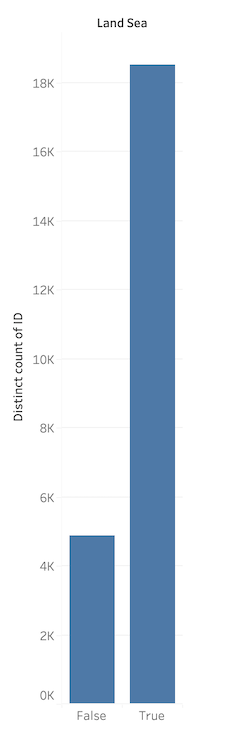
##### One Proportion testing in R
As oceans cover 71% of earth:
+ H0: Ocean Locations == 71% of earthquake events
+ Ha: Ocean Locations != 71% of earthquake events

In [28]:
prop.test(x = 18523, n = 23412, p = 0.71, alternative = "two.sided", correct = FALSE)


	1-sample proportions test without continuity correction

data:  18523 out of 23412, null probability 0.71
X-squared = 749.26, df = 1, p-value < 2.2e-16
alternative hypothesis: true p is not equal to 0.71
95 percent confidence interval:
 0.7859213 0.7963341
sample estimates:
        p 
0.7911755 


+ The p-value < 0.05, so there is a siginificant difference from expected.
+ We would expect 71% of earthquakes to be in the oceans, while 79% of them actually were.
---
##### 3) Does the depth of the earthquake affect the magnitude of the earthquake?
+ Test linear relationship between magnitude and depth

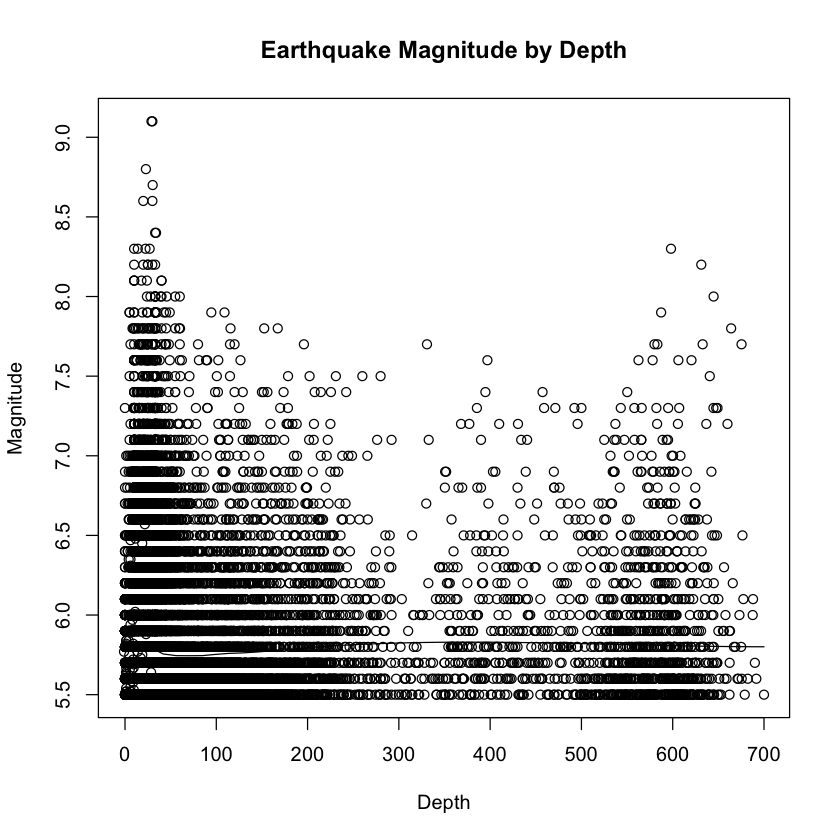

In [29]:
scatter.smooth(x = earthquakes$Depth, y = earthquakes$Magnitude, main = "Earthquake Magnitude by Depth", xlab = "Depth", ylab = "Magnitude")

+ There is no linear relationship between the two.
+ However, do water and land earthquakes need to be separated out?

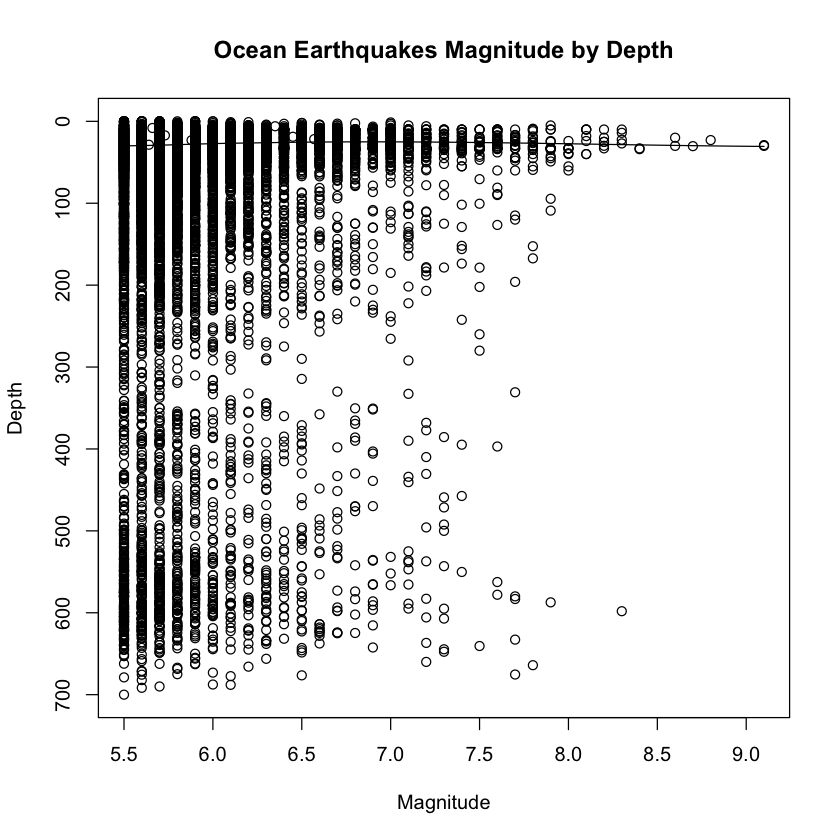

In [30]:
EarthquakesInWater <- earthquakes %>% filter(LandSea == TRUE)
scatter.smooth(x = EarthquakesInWater$Magnitude, y = EarthquakesInWater$Depth, ylim = rev(range(EarthquakesInWater$Depth)), main = "Ocean Earthquakes Magnitude by Depth", xlab = "Magnitude", ylab = "Depth")

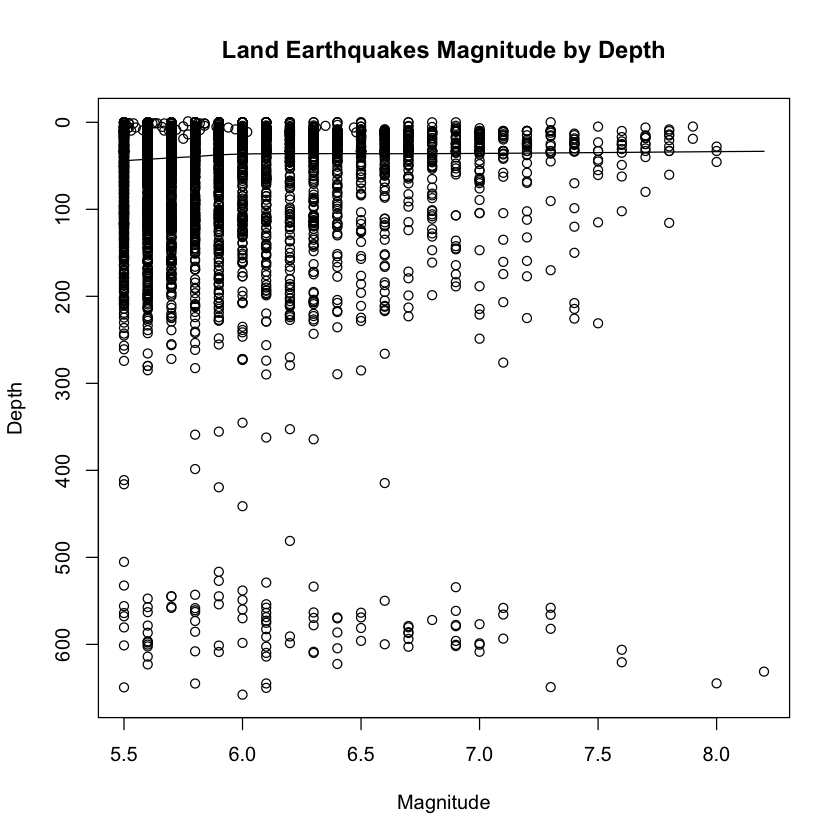

In [31]:
EarthquakesOnLand <- earthquakes %>% filter(LandSea == FALSE)
scatter.smooth(x = EarthquakesOnLand$Magnitude, y = EarthquakesOnLand$Depth, ylim = rev(range(EarthquakesOnLand$Depth)), main = "Land Earthquakes Magnitude by Depth", xlab = "Magnitude", ylab = "Depth")

+ This time, the y-axis has been inverted to show ground level at the top and depth going down.
+ However, there still does not appear to be any linear relationship or correlation between Magnitude and Depth, even when separated for water and land locations.
----
##### 4) Does the location on the earth impact the frequency and magnitude of the earthquakes?
+ How many earthquakes in each of the sections created to asses if there was an Earthquake Season?

In [32]:
EarthquakesPerZone <- earthquakes %>% count(TropicZone)
View(EarthquakesPerZone)

TropicZone,n
<chr>,<int>
Equator,1
Northern,6248
Southern,4121
Tropic of Cancer,4369
Tropic of Capricorn,8673


+ Remove the 1 occurance of an earthquake right on the equator

In [61]:
EarthquakesPerZone1 <- subset(EarthquakesPerZone[2:5,])
View(EarthquakesPerZone1)

,TropicZone,n
,<chr>,<int>
2,Northern,6248
3,Southern,4121
4,Tropic of Cancer,4369
5,Tropic of Capricorn,8673


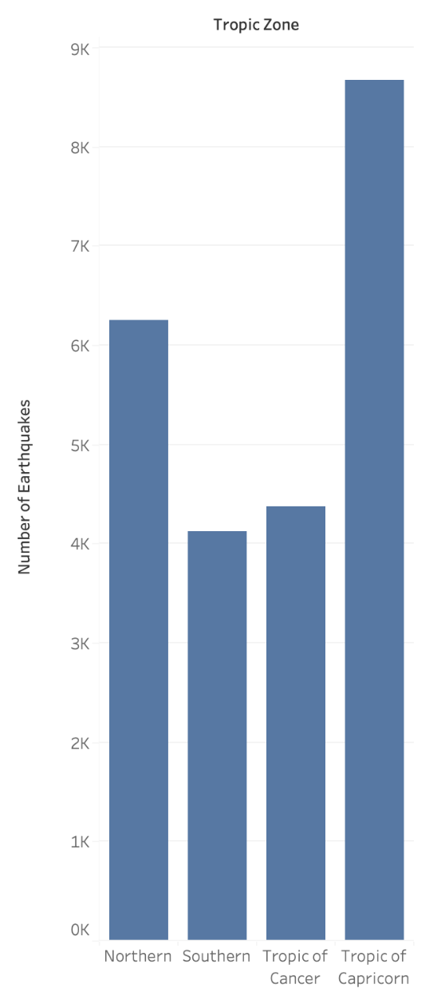

---
##### Are there more earthquakes in the area between the Equator and the Tropic of Capricorn because there are more fault lines there?
##### Import .kml file from USGS that shows Tectonic Plate boundaries on earth (for viewing in Google Earth)
+ Dataframes from .kml file cannot be viewed in Jupyter Notebook.
+ It was created in R Studio, and can be run in R Studio.

In [33]:
temp <- tempfile()
temp2 <- tempfile()
download.file("https://prd-wret.s3.us-west-2.amazonaws.com/assets/palladium/production/atoms/files/plate-boundaries.kmz", temp)
unzip(zipfile = temp, exdir = temp2)
GoogleEarthPlateBoundaries <- st_read(file.path(temp2, "doc.kml"))
unlink(c(temp,temp2))

Multiple layers are present in data source /private/var/folders/cq/34csgc994551lq_ps072fgyr0000gn/T/RtmpdQxucT/filec8e618740356/doc.kml, reading layer `Plate Interface'.
Use `st_layers' to list all layer names and their type in a data source.
Set the `layer' argument in `st_read' to read a particular layer.
Reading layer `Plate Interface' from data source `/private/var/folders/cq/34csgc994551lq_ps072fgyr0000gn/T/RtmpdQxucT/filec8e618740356/doc.kml' using driver `KML'
Simple feature collection with 1175 features and 2 fields
Geometry type: MULTILINESTRING
Dimension:     XYZ
Bounding box:  xmin: -180 ymin: -66.163 xmax: 180 ymax: 86.805
z_range:       zmin: 0 zmax: 0
Geodetic CRS:  WGS 84


##### Split Description Column into Multiple Columns to extract usable data

In [34]:
GoogleEarthPlateBoundaries2 <- separate(GoogleEarthPlateBoundaries, Description, c("V1", "V2", "V3", "V4", "V5", "V6", "V7", "V8", "V9", "V10", "V11", "V12", "V13", "V14", "V15", "V16", "V17", "V18", "V19", "V20", "V21", "V22", "V23", "V24", "V25", "V26", "V27", "V28", "V29", "V30", "V31", "V32", "V33"), sep = "<")

##### Keep only Name, V25, and Geometry

In [35]:
keeps <- c("Name", "V25", "geometry")
GoogleEarthPlateBoundaries3 <- GoogleEarthPlateBoundaries2[keeps]

##### Remove unnessary XML info

In [36]:
GoogleEarthPlateBoundaries4 <- separate(GoogleEarthPlateBoundaries3, V25, c("delete", "PlateBoundaryType"), sep = ">")

In [37]:
keepsagain <- c("Name", "PlateBoundaryType", "geometry")
GoogleEarthPlateBoundaries5 <- GoogleEarthPlateBoundaries4[keepsagain]

##### Un-nest 'geometry' column list

In [38]:
BoundaryCoordinates <- as.data.frame(do.call(rbind,GoogleEarthPlateBoundaries5$geometry))
head(BoundaryCoordinates)

,V1,V2,V3,V4
,<list>,<list>,<list>,<list>
1,"66.301, 66.544, 86.606, 86.655, 0.000, 0.000","66.301, 66.544, 86.606, 86.655, 0.000, 0.000","66.301, 66.544, 86.606, 86.655, 0.000, 0.000","66.301, 66.544, 86.606, 86.655, 0.000, 0.000"
2,"66.544, 62.463, 61.506, 58.018, 54.561, 50.770, 47.523, 46.063, 86.655, 86.755, 86.805, 86.787, 86.746, 86.706, 86.641, 86.598, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000","66.544, 62.463, 61.506, 58.018, 54.561, 50.770, 47.523, 46.063, 86.655, 86.755, 86.805, 86.787, 86.746, 86.706, 86.641, 86.598, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000","66.544, 62.463, 61.506, 58.018, 54.561, 50.770, 47.523, 46.063, 86.655, 86.755, 86.805, 86.787, 86.746, 86.706, 86.641, 86.598, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000","66.544, 62.463, 61.506, 58.018, 54.561, 50.770, 47.523, 46.063, 86.655, 86.755, 86.805, 86.787, 86.746, 86.706, 86.641, 86.598, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000"
3,"46.063, 46.314, 86.598, 86.561, 0.000, 0.000","46.063, 46.314, 86.598, 86.561, 0.000, 0.000","46.063, 46.314, 86.598, 86.561, 0.000, 0.000","46.063, 46.314, 86.598, 86.561, 0.000, 0.000"
4,"70.08949, 66.30100, 86.40396, 86.60600, 0.00000, 0.00000","70.08949, 66.30100, 86.40396, 86.60600, 0.00000, 0.00000","70.08949, 66.30100, 86.40396, 86.60600, 0.00000, 0.00000","70.08949, 66.30100, 86.40396, 86.60600, 0.00000, 0.00000"
5,"46.314, 43.479, 41.756, 38.301, 35.607, 33.340, 30.972, 29.229, 28.143, 27.427, 25.383, 23.347, 21.343, 19.285, 17.890, 16.063, 14.666, 13.242, 11.704, 10.659, 9.809, 86.561, 86.496, 86.432, 86.291, 86.161, 86.053, 85.908, 85.810, 85.874, 85.867, 85.859, 85.817, 85.799, 85.684, 85.591, 85.485, 85.380, 85.281, 85.137, 85.067, 84.958, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000","46.314, 43.479, 41.756, 38.301, 35.607, 33.340, 30.972, 29.229, 28.143, 27.427, 25.383, 23.347, 21.343, 19.285, 17.890, 16.063, 14.666, 13.242, 11.704, 10.659, 9.809, 86.561, 86.496, 86.432, 86.291, 86.161, 86.053, 85.908, 85.810, 85.874, 85.867, 85.859, 85.817, 85.799, 85.684, 85.591, 85.485, 85.380, 85.281, 85.137, 85.067, 84.958, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000","46.314, 43.479, 41.756, 38.301, 35.607, 33.340, 30.972, 29.229, 28.143, 27.427, 25.383, 23.347, 21.343, 19.285, 17.890, 16.063, 14.666, 13.242, 11.704, 10.659, 9.809, 86.561, 86.496, 86.432, 86.291, 86.161, 86.053, 85.908, 85.810, 85.874, 85.867, 85.859, 85.817, 85.799, 85.684, 85.591, 85.485, 85.380, 85.281, 85.137, 85.067, 84.958, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000","46.314, 43.479, 41.756, 38.301, 35.607, 33.340, 30.972, 29.229, 28.143, 27.427, 25.383, 23.347, 21.343, 19.285, 17.890, 16.063, 14.666, 13.242, 11.704, 10.659, 9.809, 86.561, 86.496, 86.432, 86.291, 86.161, 86.053, 85.908, 85.810, 85.874, 85.867, 85.859, 85.817, 85.799, 85.684, 85.591, 85.485, 85.380, 85.281, 85.137, 85.067, 84.958, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000"
6,"9.809, 8.938, 84.958, 85.009, 0.000, 0.000","9.809, 8.938, 84.958, 85.009, 0.000, 0.000","9.809, 8.938, 84.958, 85.009, 0.000, 0.000","9.809, 8.938, 84.958, 85.009, 0.000, 0.000"


In [39]:
keeps3 <- c("V1")
BoundaryCoordinates1 <- BoundaryCoordinates[keeps3]
head(BoundaryCoordinates1)

,V1
,<list>
1,"66.301, 66.544, 86.606, 86.655, 0.000, 0.000"
2,"66.544, 62.463, 61.506, 58.018, 54.561, 50.770, 47.523, 46.063, 86.655, 86.755, 86.805, 86.787, 86.746, 86.706, 86.641, 86.598, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000"
3,"46.063, 46.314, 86.598, 86.561, 0.000, 0.000"
4,"70.08949, 66.30100, 86.40396, 86.60600, 0.00000, 0.00000"
5,"46.314, 43.479, 41.756, 38.301, 35.607, 33.340, 30.972, 29.229, 28.143, 27.427, 25.383, 23.347, 21.343, 19.285, 17.890, 16.063, 14.666, 13.242, 11.704, 10.659, 9.809, 86.561, 86.496, 86.432, 86.291, 86.161, 86.053, 85.908, 85.810, 85.874, 85.867, 85.859, 85.817, 85.799, 85.684, 85.591, 85.485, 85.380, 85.281, 85.137, 85.067, 84.958, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000"
6,"9.809, 8.938, 84.958, 85.009, 0.000, 0.000"


##### Remove zeros

In [40]:
BoundaryCoordinates2 <- cbind(lapply(BoundaryCoordinates1$V1, function(x) {x[x!=0]}))
head(BoundaryCoordinates2)

"66.301, 66.544, 86.606, 86.655"
"66.544, 62.463, 61.506, 58.018, 54.561, 50.770, 47.523, 46.063, 86.655, 86.755, 86.805, 86.787, 86.746, 86.706, 86.641, 86.598"
"46.063, 46.314, 86.598, 86.561"
"70.08949, 66.30100, 86.40396, 86.60600"
"46.314, 43.479, 41.756, 38.301, 35.607, 33.340, 30.972, 29.229, 28.143, 27.427, 25.383, 23.347, 21.343, 19.285, 17.890, 16.063, 14.666, 13.242, 11.704, 10.659, 9.809, 86.561, 86.496, 86.432, 86.291, 86.161, 86.053, 85.908, 85.810, 85.874, 85.867, 85.859, 85.817, 85.799, 85.684, 85.591, 85.485, 85.380, 85.281, 85.137, 85.067, 84.958"
"9.809, 8.938, 84.958, 85.009"


##### Split lists into half to separate latitudes from longitudes

In [41]:
BoundaryCoordinates3 <- lapply(BoundaryCoordinates2, function(x) list(
  Longitudes = I(list(x[1:(length(x) / 2)])), 
  Latitudes = I(list(x[(length(x) / 2 + 1):length(x)]))))
BoundaryCoordinates3 <- do.call('rbind',BoundaryCoordinates3)   
View(BoundaryCoordinates3)

Longitudes                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             
 [1,] 66.301, 66.544                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         
 [2,] 66.544, 62.463, 61.506, 58.018, 54.561, 50.770, 47.523, 46.063                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         
 [3,] 46.063, 46.314                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         
 [4,] 70.08949, 66.30100                                                                                                                                                                                                                                                                                      

##### Convert back into a data frame

In [42]:
BoundaryCoordinates4 <- as.data.frame(BoundaryCoordinates3)
View(BoundaryCoordinates4)

Longitudes,Latitudes
<list>,<list>
"66.301, 66.544","86.606, 86.655"
"66.544, 62.463, 61.506, 58.018, 54.561, 50.770, 47.523, 46.063","86.655, 86.755, 86.805, 86.787, 86.746, 86.706, 86.641, 86.598"
"46.063, 46.314","86.598, 86.561"
"70.08949, 66.30100","86.40396, 86.60600"
"46.314, 43.479, 41.756, 38.301, 35.607, 33.340, 30.972, 29.229, 28.143, 27.427, 25.383, 23.347, 21.343, 19.285, 17.890, 16.063, 14.666, 13.242, 11.704, 10.659, 9.809","86.561, 86.496, 86.432, 86.291, 86.161, 86.053, 85.908, 85.810, 85.874, 85.867, 85.859, 85.817, 85.799, 85.684, 85.591, 85.485, 85.380, 85.281, 85.137, 85.067, 84.958"
"9.809, 8.938","84.958, 85.009"
"8.938, 8.134, 6.665, 5.177, 4.508","85.009, 84.898, 84.762, 84.632, 84.570"
"4.508, 4.035","84.570, 84.597"
"4.035, 3.848, 3.024, 2.235, 1.301, 0.405, -0.469, -1.206, -2.363, -3.204, -4.148, -5.154, -6.234, -7.212","84.597, 84.561, 84.462, 84.343, 84.223, 84.102, 83.996, 83.864, 83.690, 83.570, 83.430, 83.249, 83.000, 82.868"


In [43]:
Longitudes <- as.data.frame(do.call(rbind,BoundaryCoordinates4$Longitudes))
Latitudes <- as.data.frame(do.call(rbind,BoundaryCoordinates4$Latitudes))

##### Separate out again

In [44]:
Longitudes1 <- unnest_wider(Longitudes, col = V1, names_sep = " Long ")
Latitudes1 <- unnest_wider(Latitudes, col = V1, names_sep = " Lat ")

##### Rename Columns

In [45]:
names(Longitudes1)[1:98] <- c("Long1","Long2","Long3","Long4","Long5","Long6","Long7","Long8","Long9","Long10","Long11","Long12","Long13","Long14","Long15","Long16","Long17","Long18","Long19","Long20","Long21","Long22","Long23","Long24","Long25","Long26","Long27","Long28","Long29","Long30","Long31","Long32","Long33","Long34","Long35","Long36","Long37","Long38","Long39","Long40","Long41","Long42","Long43","Long44","Long45","Long46","Long47","Long48","Long49","Long50")
names(Latitudes1)[1:98] <- c("Lat1","Lat2","Lat3","Lat4","Lat5","Lat6","Lat7","Lat8","Lat9","Lat10","Lat11","Lat12","Lat13","Lat14","Lat15","Lat16","Lat17","Lat18","Lat19","Lat20","Lat21","Lat22","Lat23","Lat24","Lat25","Lat26","Lat27","Lat28","Lat29","Lat30","Lat31","Lat32","Lat33","Lat34","Lat35","Lat36","Lat37","Lat38","Lat39","Lat40","Lat41","Lat42","Lat43","Lat44","Lat45","Lat46","Lat47","Lat48","Lat49","Lat50")

##### Remove 'V1' and space

In [46]:
names(Longitudes1) <- gsub("V1", "", names(Longitudes1))
names(Longitudes1) <- gsub(" ", "", names(Longitudes1))

names(Latitudes1) <- gsub("V1", "", names(Latitudes1))
names(Latitudes1) <- gsub(" ", "", names(Latitudes1))

##### Change BACK to a dataframe

In [47]:
Latitudes2 <- as.data.frame(Latitudes1)
Longitudes2 <- as.data.frame(Longitudes1)

##### Combine Datasets

In [48]:
BoundaryCoordinates5 <- cbind(Longitudes2[1:98],Latitudes2[1:98])
View(BoundaryCoordinates5)

Long1,Long2,Long3,Long4,Long5,Long6,Long7,Long8,Long9,Long10,⋯,Lat39.1,Lat40.1,Lat41.1,Lat42.1,Lat43.1,Lat44.1,Lat45.1,Lat46.1,Lat47.1,Lat48.1
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
66.30100,66.5440,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
66.54400,62.4630,61.5060,58.0180,54.5610,50.770,47.523,46.063,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
46.06300,46.3140,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
70.08949,66.3010,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
46.31400,43.4790,41.7560,38.3010,35.6070,33.340,30.972,29.229,28.143,27.427,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
9.80900,8.9380,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
8.93800,8.1340,6.6650,5.1770,4.5080,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
4.50800,4.0350,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
4.03500,3.8480,3.0240,2.2350,1.3010,0.405,-0.469,-1.206,-2.363,-3.204,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


##### Combine coordinates to make geopoints

In [49]:
BoundaryCoordinates5$Point1 <- paste(BoundaryCoordinates5$Lat1,',',BoundaryCoordinates5$Long1)
BoundaryCoordinates5$Point2 <- paste(BoundaryCoordinates5$Lat2,',',BoundaryCoordinates5$Long2)
BoundaryCoordinates5$Point3 <- paste(BoundaryCoordinates5$Lat3,',',BoundaryCoordinates5$Long3)
BoundaryCoordinates5$Point4 <- paste(BoundaryCoordinates5$Lat4,',',BoundaryCoordinates5$Long4)
BoundaryCoordinates5$Point5 <- paste(BoundaryCoordinates5$Lat5,',',BoundaryCoordinates5$Long5)
BoundaryCoordinates5$Point6 <- paste(BoundaryCoordinates5$Lat6,',',BoundaryCoordinates5$Long6)
BoundaryCoordinates5$Point7 <- paste(BoundaryCoordinates5$Lat7,',',BoundaryCoordinates5$Long7)
BoundaryCoordinates5$Point8 <- paste(BoundaryCoordinates5$Lat8,',',BoundaryCoordinates5$Long8)
BoundaryCoordinates5$Point9 <- paste(BoundaryCoordinates5$Lat9,',',BoundaryCoordinates5$Long9)
BoundaryCoordinates5$Point10 <- paste(BoundaryCoordinates5$Lat10,',',BoundaryCoordinates5$Long10)
BoundaryCoordinates5$Point11 <- paste(BoundaryCoordinates5$Lat11,',',BoundaryCoordinates5$Long11)
BoundaryCoordinates5$Point12 <- paste(BoundaryCoordinates5$Lat12,',',BoundaryCoordinates5$Long12)
BoundaryCoordinates5$Point13 <- paste(BoundaryCoordinates5$Lat13,',',BoundaryCoordinates5$Long13)
BoundaryCoordinates5$Point14 <- paste(BoundaryCoordinates5$Lat14,',',BoundaryCoordinates5$Long14)
BoundaryCoordinates5$Point15 <- paste(BoundaryCoordinates5$Lat15,',',BoundaryCoordinates5$Long15)
BoundaryCoordinates5$Point16 <- paste(BoundaryCoordinates5$Lat16,',',BoundaryCoordinates5$Long16)
BoundaryCoordinates5$Point17 <- paste(BoundaryCoordinates5$Lat17,',',BoundaryCoordinates5$Long17)
BoundaryCoordinates5$Point18 <- paste(BoundaryCoordinates5$Lat18,',',BoundaryCoordinates5$Long18)
BoundaryCoordinates5$Point19 <- paste(BoundaryCoordinates5$Lat19,',',BoundaryCoordinates5$Long19)
BoundaryCoordinates5$Point20 <- paste(BoundaryCoordinates5$Lat20,',',BoundaryCoordinates5$Long20)
BoundaryCoordinates5$Point21 <- paste(BoundaryCoordinates5$Lat21,',',BoundaryCoordinates5$Long21)
BoundaryCoordinates5$Point22 <- paste(BoundaryCoordinates5$Lat22,',',BoundaryCoordinates5$Long22)
BoundaryCoordinates5$Point23 <- paste(BoundaryCoordinates5$Lat23,',',BoundaryCoordinates5$Long23)
BoundaryCoordinates5$Point24 <- paste(BoundaryCoordinates5$Lat24,',',BoundaryCoordinates5$Long24)
BoundaryCoordinates5$Point25 <- paste(BoundaryCoordinates5$Lat25,',',BoundaryCoordinates5$Long25)
BoundaryCoordinates5$Point26 <- paste(BoundaryCoordinates5$Lat26,',',BoundaryCoordinates5$Long26)
BoundaryCoordinates5$Point27 <- paste(BoundaryCoordinates5$Lat27,',',BoundaryCoordinates5$Long27)
BoundaryCoordinates5$Point28 <- paste(BoundaryCoordinates5$Lat28,',',BoundaryCoordinates5$Long28)
BoundaryCoordinates5$Point29 <- paste(BoundaryCoordinates5$Lat29,',',BoundaryCoordinates5$Long29)
BoundaryCoordinates5$Point30 <- paste(BoundaryCoordinates5$Lat30,',',BoundaryCoordinates5$Long30)
BoundaryCoordinates5$Point31 <- paste(BoundaryCoordinates5$Lat31,',',BoundaryCoordinates5$Long31)
BoundaryCoordinates5$Point32 <- paste(BoundaryCoordinates5$Lat32,',',BoundaryCoordinates5$Long32)
BoundaryCoordinates5$Point33 <- paste(BoundaryCoordinates5$Lat33,',',BoundaryCoordinates5$Long33)
BoundaryCoordinates5$Point34 <- paste(BoundaryCoordinates5$Lat34,',',BoundaryCoordinates5$Long34)
BoundaryCoordinates5$Point35 <- paste(BoundaryCoordinates5$Lat35,',',BoundaryCoordinates5$Long35)
BoundaryCoordinates5$Point36 <- paste(BoundaryCoordinates5$Lat36,',',BoundaryCoordinates5$Long36)
BoundaryCoordinates5$Point37 <- paste(BoundaryCoordinates5$Lat37,',',BoundaryCoordinates5$Long37)
BoundaryCoordinates5$Point38 <- paste(BoundaryCoordinates5$Lat38,',',BoundaryCoordinates5$Long38)
BoundaryCoordinates5$Point39 <- paste(BoundaryCoordinates5$Lat39,',',BoundaryCoordinates5$Long39)
BoundaryCoordinates5$Point40 <- paste(BoundaryCoordinates5$Lat40,',',BoundaryCoordinates5$Long40)
BoundaryCoordinates5$Point41 <- paste(BoundaryCoordinates5$Lat41,',',BoundaryCoordinates5$Long41)
BoundaryCoordinates5$Point42 <- paste(BoundaryCoordinates5$Lat42,',',BoundaryCoordinates5$Long42)
BoundaryCoordinates5$Point43 <- paste(BoundaryCoordinates5$Lat43,',',BoundaryCoordinates5$Long43)
BoundaryCoordinates5$Point44 <- paste(BoundaryCoordinates5$Lat44,',',BoundaryCoordinates5$Long44)
BoundaryCoordinates5$Point45 <- paste(BoundaryCoordinates5$Lat45,',',BoundaryCoordinates5$Long45)
BoundaryCoordinates5$Point46 <- paste(BoundaryCoordinates5$Lat46,',',BoundaryCoordinates5$Long46)
BoundaryCoordinates5$Point47 <- paste(BoundaryCoordinates5$Lat47,',',BoundaryCoordinates5$Long47)
BoundaryCoordinates5$Point48 <- paste(BoundaryCoordinates5$Lat48,',',BoundaryCoordinates5$Long48)
BoundaryCoordinates5$Point49 <- paste(BoundaryCoordinates5$Lat49,',',BoundaryCoordinates5$Long49)
BoundaryCoordinates5$Point50 <- paste(BoundaryCoordinates5$Lat50,',',BoundaryCoordinates5$Long50)
BoundaryCoordinates5$Point51 <- paste(BoundaryCoordinates5$Lat51,',',BoundaryCoordinates5$Long51)
BoundaryCoordinates5$Point52 <- paste(BoundaryCoordinates5$Lat52,',',BoundaryCoordinates5$Long52)
BoundaryCoordinates5$Point53 <- paste(BoundaryCoordinates5$Lat53,',',BoundaryCoordinates5$Long53)
BoundaryCoordinates5$Point54 <- paste(BoundaryCoordinates5$Lat54,',',BoundaryCoordinates5$Long54)
BoundaryCoordinates5$Point55 <- paste(BoundaryCoordinates5$Lat55,',',BoundaryCoordinates5$Long55)
BoundaryCoordinates5$Point56 <- paste(BoundaryCoordinates5$Lat56,',',BoundaryCoordinates5$Long56)
BoundaryCoordinates5$Point57 <- paste(BoundaryCoordinates5$Lat57,',',BoundaryCoordinates5$Long57)
BoundaryCoordinates5$Point58 <- paste(BoundaryCoordinates5$Lat58,',',BoundaryCoordinates5$Long58)
BoundaryCoordinates5$Point59 <- paste(BoundaryCoordinates5$Lat59,',',BoundaryCoordinates5$Long59)
BoundaryCoordinates5$Point60 <- paste(BoundaryCoordinates5$Lat60,',',BoundaryCoordinates5$Long60)
BoundaryCoordinates5$Point61 <- paste(BoundaryCoordinates5$Lat61,',',BoundaryCoordinates5$Long61)
BoundaryCoordinates5$Point62 <- paste(BoundaryCoordinates5$Lat62,',',BoundaryCoordinates5$Long62)
BoundaryCoordinates5$Point63 <- paste(BoundaryCoordinates5$Lat63,',',BoundaryCoordinates5$Long63)
BoundaryCoordinates5$Point64 <- paste(BoundaryCoordinates5$Lat64,',',BoundaryCoordinates5$Long64)
BoundaryCoordinates5$Point65 <- paste(BoundaryCoordinates5$Lat65,',',BoundaryCoordinates5$Long65)
BoundaryCoordinates5$Point66 <- paste(BoundaryCoordinates5$Lat66,',',BoundaryCoordinates5$Long66)
BoundaryCoordinates5$Point67 <- paste(BoundaryCoordinates5$Lat67,',',BoundaryCoordinates5$Long67)
BoundaryCoordinates5$Point68 <- paste(BoundaryCoordinates5$Lat68,',',BoundaryCoordinates5$Long68)
BoundaryCoordinates5$Point69 <- paste(BoundaryCoordinates5$Lat69,',',BoundaryCoordinates5$Long69)
BoundaryCoordinates5$Point70 <- paste(BoundaryCoordinates5$Lat70,',',BoundaryCoordinates5$Long70)
BoundaryCoordinates5$Point71 <- paste(BoundaryCoordinates5$Lat71,',',BoundaryCoordinates5$Long71)
BoundaryCoordinates5$Point72 <- paste(BoundaryCoordinates5$Lat72,',',BoundaryCoordinates5$Long72)
BoundaryCoordinates5$Point73 <- paste(BoundaryCoordinates5$Lat73,',',BoundaryCoordinates5$Long73)
BoundaryCoordinates5$Point74 <- paste(BoundaryCoordinates5$Lat74,',',BoundaryCoordinates5$Long74)
BoundaryCoordinates5$Point75 <- paste(BoundaryCoordinates5$Lat75,',',BoundaryCoordinates5$Long75)
BoundaryCoordinates5$Point76 <- paste(BoundaryCoordinates5$Lat76,',',BoundaryCoordinates5$Long76)
BoundaryCoordinates5$Point77 <- paste(BoundaryCoordinates5$Lat77,',',BoundaryCoordinates5$Long77)
BoundaryCoordinates5$Point78 <- paste(BoundaryCoordinates5$Lat78,',',BoundaryCoordinates5$Long78)
BoundaryCoordinates5$Point79 <- paste(BoundaryCoordinates5$Lat79,',',BoundaryCoordinates5$Long79)
BoundaryCoordinates5$Point80 <- paste(BoundaryCoordinates5$Lat80,',',BoundaryCoordinates5$Long80)
BoundaryCoordinates5$Point81 <- paste(BoundaryCoordinates5$Lat81,',',BoundaryCoordinates5$Long81)
BoundaryCoordinates5$Point82 <- paste(BoundaryCoordinates5$Lat82,',',BoundaryCoordinates5$Long82)
BoundaryCoordinates5$Point83 <- paste(BoundaryCoordinates5$Lat83,',',BoundaryCoordinates5$Long83)
BoundaryCoordinates5$Point84 <- paste(BoundaryCoordinates5$Lat84,',',BoundaryCoordinates5$Long84)
BoundaryCoordinates5$Point85 <- paste(BoundaryCoordinates5$Lat85,',',BoundaryCoordinates5$Long85)
BoundaryCoordinates5$Point86 <- paste(BoundaryCoordinates5$Lat86,',',BoundaryCoordinates5$Long86)
BoundaryCoordinates5$Point87 <- paste(BoundaryCoordinates5$Lat87,',',BoundaryCoordinates5$Long87)
BoundaryCoordinates5$Point88 <- paste(BoundaryCoordinates5$Lat88,',',BoundaryCoordinates5$Long88)
BoundaryCoordinates5$Point89 <- paste(BoundaryCoordinates5$Lat89,',',BoundaryCoordinates5$Long89)
BoundaryCoordinates5$Point90 <- paste(BoundaryCoordinates5$Lat90,',',BoundaryCoordinates5$Long90)
BoundaryCoordinates5$Point91 <- paste(BoundaryCoordinates5$Lat91,',',BoundaryCoordinates5$Long91)
BoundaryCoordinates5$Point92 <- paste(BoundaryCoordinates5$Lat92,',',BoundaryCoordinates5$Long92)
BoundaryCoordinates5$Point93 <- paste(BoundaryCoordinates5$Lat93,',',BoundaryCoordinates5$Long93)
BoundaryCoordinates5$Point94 <- paste(BoundaryCoordinates5$Lat94,',',BoundaryCoordinates5$Long94)
BoundaryCoordinates5$Point95 <- paste(BoundaryCoordinates5$Lat95,',',BoundaryCoordinates5$Long95)
BoundaryCoordinates5$Point96 <- paste(BoundaryCoordinates5$Lat96,',',BoundaryCoordinates5$Long96)
BoundaryCoordinates5$Point97 <- paste(BoundaryCoordinates5$Lat97,',',BoundaryCoordinates5$Long97)
BoundaryCoordinates5$Point98 <- paste(BoundaryCoordinates5$Lat98,',',BoundaryCoordinates5$Long98)

In [50]:
BoundaryCoordinates7 <- BoundaryCoordinates5[197:294]
View(BoundaryCoordinates7)

Point1,Point2,Point3,Point4,Point5,Point6,Point7,Point8,Point9,Point10,⋯,Point89,Point90,Point91,Point92,Point93,Point94,Point95,Point96,Point97,Point98
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
"86.6060028079833 , 66.3010025028633","86.6549987795701 , 66.5439987180665","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA",⋯,",",",",",",",",",",",",",",",",",",","
"86.6549987795701 , 66.5439987180665","86.7549972532207 , 62.463001250907","86.8050003054198 , 61.5060005190088","86.7870025636175 , 58.0180015560271","86.7460021972437 , 54.5610008237291","86.7060012816339 , 50.770000457655","86.6409988399246 , 47.522998810147","86.597999572922 , 46.0629997251572","NA , NA","NA , NA",⋯,",",",",",",",",",",",",",",",",",",","
"86.597999572922 , 46.0629997251572","86.5609970096044 , 46.313999176321","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA",⋯,",",",",",",",",",",",",",",",",",",","
"86.4039611818631 , 70.0894851683059","86.6060028079833 , 66.3010025028633","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA",⋯,",",",",",",",",",",",",",",",",",",","
"86.5609970096044 , 46.313999176321","86.496002196844 , 43.4790000913812","86.431999206798 , 41.7560005189089","86.2910003658743 , 38.300998688139","86.1610031132032 , 35.6069984432236","86.053001403592 , 33.3400001521853","85.9079971315624 , 30.9720001218082","85.8099975585405 , 29.2290000919807","85.8740005494858 , 28.1429996489147","85.8669967651886 , 27.4270000456157",⋯,",",",",",",",",",",",",",",",",",",","
"84.958000183062 , 9.80900001513862","85.0090026851259 , 8.93799972560691","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA",⋯,",",",",",",",",",",",",",",",",",",","
"85.0090026851259 , 8.93799972560691","84.8980026241219 , 8.13399982423255","84.7620010379176 , 6.66499996177885","84.6320037843472 , 5.17700004601534","84.5699996949301 , 4.50799989687778","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA",⋯,",",",",",",",",",",",",",",",",",",","
"84.5699996949301 , 4.50799989687778","84.5970001216584 , 4.03499984706537","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA",⋯,",",",",",",",",",",",",",",",",",",","
"84.5970001216584 , 4.03499984706537","84.5609970091048 , 3.84800004946277","84.4619979862181 , 3.02399992905356","84.3430023191018 , 2.23499989472941","84.2229995731718 , 1.30099999865104","84.1019973755785 , 0.405000001448968","83.9960021973436 , -0.469000011841047","83.8639984132962 , -1.20599997022242","83.6900024410598 , -2.36299991571349","83.5699996951299 , -3.20399999630274",⋯,",",",",",",",",",",",",",",",",",",","


##### Rename columns

In [51]:
names(Longitudes) <- gsub("V1", "Longitudes", names(Longitudes))
names(Latitudes) <- gsub("V1", "Latitudes", names(Latitudes))

##### Add columns back into original

In [52]:
GoogleEarthPlateBoundaries6 <- bind_cols(GoogleEarthPlateBoundaries5, BoundaryCoordinates7)

##### Drop 'geometry' list

In [53]:
drop <- c("geometry")
GoogleEarthPlateBoundaries7 <- GoogleEarthPlateBoundaries6[,!(names(GoogleEarthPlateBoundaries6) %in% drop)]

##### Export File

In [54]:
write_csv(GoogleEarthPlateBoundaries6, "GoogleEarthPlateBoundaries6.csv")

##### Add distance from Distance tool
+ http://www.zonums.com/online/kmlArea/
+ Use Excel to insert text data as "DistanceKM" into and reload

In [55]:
BoundaryDistance <- read_excel("/Users/gonzalezfamily/Documents/GitHub/FinalProject2021/Data/GoogleEarthPlateBoundaries7.xlsx")
head(BoundaryDistance)

Name,DistanceKM,PlateBoundaryType,Section,Point1,Point2,Point3,Point4,Point5,Point6,⋯,Point90,Point91,Point92,Point93,Point94,Point95,Point96,Point97,Point98,geometry
<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>
Eurasian:North American,5.697855,Transform Boundary,Northern,"86.6060028079833 , 66.3010025028633","86.6549987795701 , 66.5439987180665","NA , NA","NA , NA","NA , NA","NA , NA",⋯,"NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA",NA
Eurasian:North American,138.307843,Divergent Boundary,Northern,"86.6549987795701 , 66.5439987180665","86.7549972532207 , 62.463001250907","86.8050003054198 , 61.5060005190088","86.7870025636175 , 58.0180015560271","86.7460021972437 , 54.5610008237291","86.7060012816339 , 50.770000457655",⋯,"NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA",NA
Eurasian:North American,4.456678,Transform Boundary,Northern,"86.597999572922 , 46.0629997251572","86.5609970096044 , 46.313999176321","NA , NA","NA , NA","NA , NA","NA , NA",⋯,"NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA",NA
Eurasian:North American,34.247742,Divergent Boundary,Northern,"86.4039611818631 , 70.0894851683059","86.6060028079833 , 66.3010025028633","NA , NA","NA , NA","NA , NA","NA , NA",⋯,"NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA",NA
Eurasian:North American,358.347461,Divergent Boundary,Northern,"86.5609970096044 , 46.313999176321","86.496002196844 , 43.4790000913812","86.431999206798 , 41.7560005189089","86.2910003658743 , 38.300998688139","86.1610031132032 , 35.6069984432236","86.053001403592 , 33.3400001521853",⋯,"NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA",NA
Eurasian:North American,10.233454,Transform Boundary,Northern,"84.958000183062 , 9.80900001513862","85.0090026851259 , 8.93799972560691","NA , NA","NA , NA","NA , NA","NA , NA",⋯,"NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA","NA , NA",NA


##### Calculate Distance of each Plate Boundary

In [62]:
PlateBoundaryMeasurements <- BoundaryDistance %>% group_by(Name) %>%
  summarize(SumDist = sum(DistanceKM))
View(PlateBoundaryMeasurements)

Name,SumDist
<chr>,<dbl>
Africa:Eurasia,4190.2604
African:Antarctic,8830.7307
African:Arabian,4882.2040
African:Australian,3799.0389
African:Indian,3152.0973
African:South American,14960.8346
Antarctic:Nazca,4125.9165
Antarctic:Scotia,2246.6981
Antarctica:Scotia,1056.4535


##### Distance (in km) of plate boundary distance in each section of earth divided above

In [63]:
DistancebySection <- BoundaryDistance %>% group_by(Section) %>%
  summarize(Distance = sum(DistanceKM))
View(DistancebySection)

Section,Distance
<chr>,<dbl>
Northern,55869.41
Southern,59931.75
Tropic of Cancer,35933.56
Tropic of Capricorn,37873.44


##### Combine EarthquakesPerZone1 and DistancebySection

In [69]:
EarthquakesPerZone2 <- merge(x = EarthquakesPerZone1, y = DistancebySection, by.x = "TropicZone", by.y = "Section", all = TRUE)
View(EarthquakesPerZone2)

TropicZone,n,Distance
<chr>,<int>,<dbl>
Northern,6248,55869.41
Southern,4121,59931.75
Tropic of Cancer,4369,35933.56
Tropic of Capricorn,8673,37873.44


##### Rename columns

In [70]:
names(EarthquakesPerZone2)[names(EarthquakesPerZone2) == "n"] <- "NumberOfEarthquakes"
names(EarthquakesPerZone2)[names(EarthquakesPerZone2) == "Distance"] <- "PlateBoundaryDistance"
print(EarthquakesPerZone2)

           TropicZone NumberOfEarthquakes PlateBoundaryDistance
1            Northern                6248              55869.41
2            Southern                4121              59931.75
3    Tropic of Cancer                4369              35933.56
4 Tropic of Capricorn                8673              37873.44


##### Turn Plate Boundary Distance into percentage of whole earth
+ Use to run Goodness of Fit Chi Square

In [71]:
EarthquakesPerZone2$PercentofWhole <- EarthquakesPerZone2$PlateBoundaryDistance/sum(EarthquakesPerZone2$PlateBoundaryDistance)

In [67]:
observed = c(6248, 4121, 4369, 8673)
expected = c(0.29, 0.32, 0.19, 0.20)
chisq.test( x = observed, p = expected)


	Chi-squared test for given probabilities

data:  observed
X-squared = 4962.5, df = 3, p-value < 2.2e-16


+ p-value is < 0.05, so rates of earthquakes do not line up with expected ratios from the total amount of distance of plate boundaries.

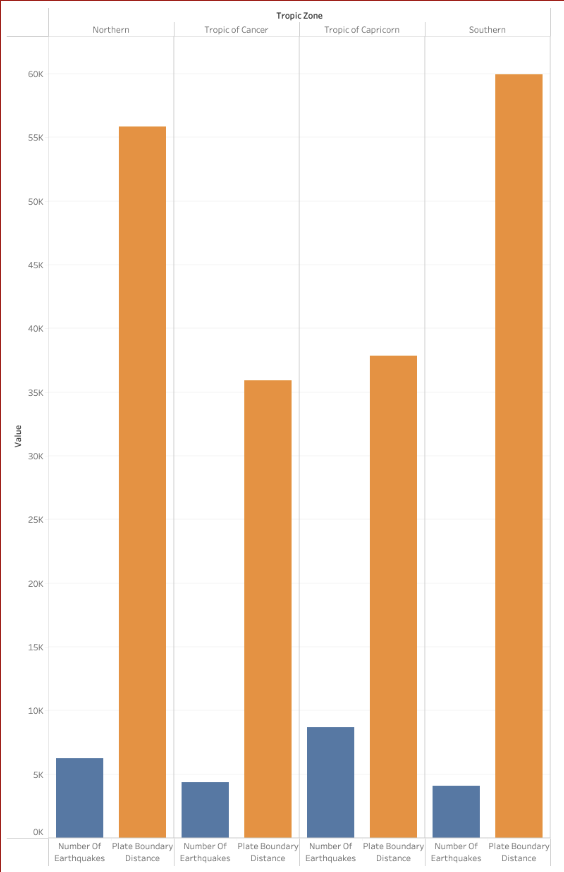

---

#### 4) Has the number of earthquakes per year changed over time?
+ Separate out years from the Date

In [72]:
earthquakesByYear <- separate(earthquakes, Date, c("Year", "Month", "Day"))
head(earthquakesByYear)

,Year,Month,Day,Time,Latitude,Longitude,Type,Depth,Magnitude,ID,MonthDay,Hemisphere,TropicZone,Season,Count,LandSea
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<lgl>
1,1965,01,02,13:44:18,19.246,145.616,Earthquake,131.6,6.0,ISCGEM860706,01/02,Tropics,Tropic of Cancer,Tropical,1,TRUE
2,1965,01,04,11:29:49,1.863,127.352,Earthquake,80.0,5.8,ISCGEM860737,01/04,Tropics,Tropic of Cancer,Tropical,1,TRUE
3,1965,01,05,18:05:58,-20.579,-173.972,Earthquake,20.0,6.2,ISCGEM860762,01/05,Tropics,Tropic of Capricorn,Tropical,1,TRUE
4,1965,01,08,18:49:43,-59.076,-23.557,Earthquake,15.0,5.8,ISCGEM860856,01/08,Southern,Southern,Summer,1,TRUE
5,1965,01,09,13:32:50,11.938,126.427,Earthquake,15.0,5.8,ISCGEM860890,01/09,Tropics,Tropic of Cancer,Tropical,1,TRUE
6,1965,01,10,13:36:32,-13.405,166.629,Earthquake,35.0,6.7,ISCGEM860922,01/10,Tropics,Tropic of Capricorn,Tropical,1,TRUE


In [73]:
earthquakeCountYears <- earthquakesByYear %>% group_by(Year) %>% summarize(count = n())
head(earthquakeCountYears)

Year,count
<chr>,<int>
1965,339
1966,234
1967,255
1968,305
1969,323
1970,345


##### Drop NAs

In [102]:
earthquakeCountYears <- drop_na(earthquakeCountYears)

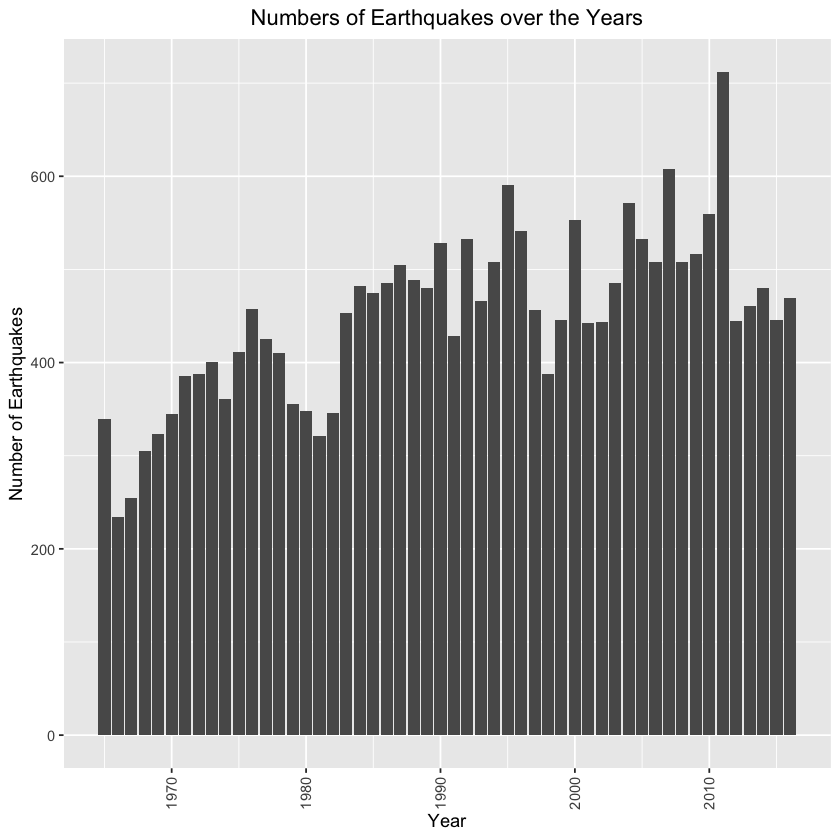

In [103]:
ggplot(earthquakeCountYears, aes( x = Year, y = count)) +
  ggtitle("Numbers of Earthquakes over the Years") +
  scale_y_continuous(name = "Number of Earthquakes") +
  theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1), plot.title = element_text(hjust = 0.5)) +
  geom_col()

In [109]:
earthquakeCountYears$Year <- as.numeric(earthquakeCountYears$Year)

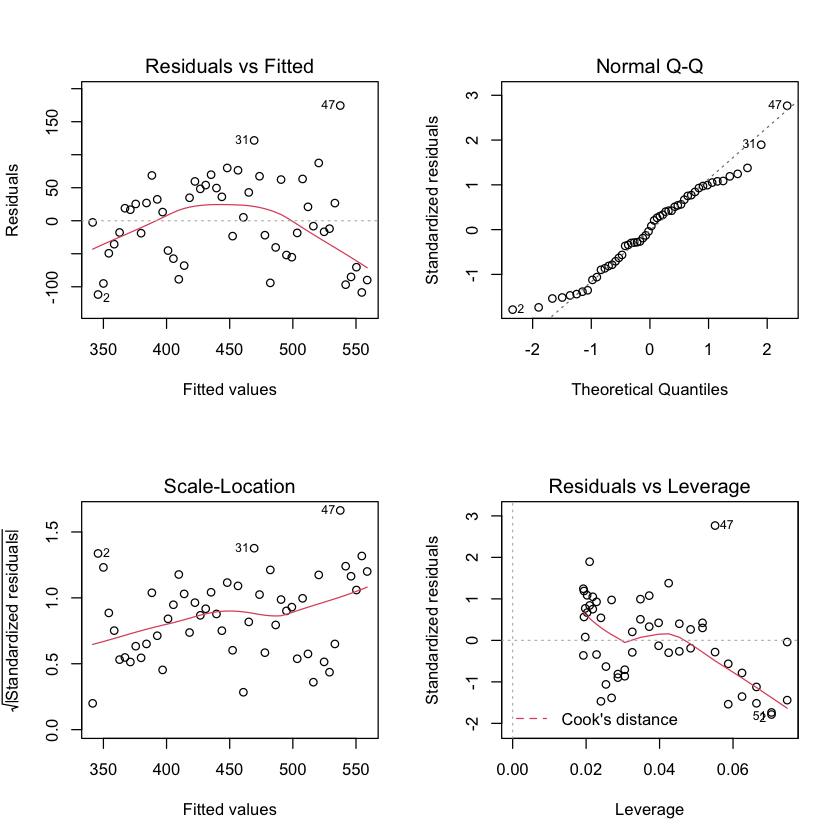

In [110]:
EarthquakesOverTheYears <- lm(count ~ Year, data = earthquakeCountYears)
par(mfrow=c(2,2))
plot(EarthquakesOverTheYears)

##### Breush-Pagan to test for Homoscedasticity

In [111]:
lmtest::bptest(EarthquakesOverTheYears)


	studentized Breusch-Pagan test

data:  EarthquakesOverTheYears
BP = 3.9961, df = 1, p-value = 0.0456


Cut off right at level for no violation
##### NCV test

In [112]:
car::ncvTest(EarthquakesOverTheYears)

Non-constant Variance Score Test 
Variance formula: ~ fitted.values 
Chisquare = 3.236142, Df = 1, p = 0.07203

+ p-value also just passes test for homoscedasticity

In [113]:
summary(EarthquakesOverTheYears)


Call:
lm(formula = count ~ Year, data = earthquakeCountYears)

Residuals:
     Min       1Q   Median       3Q      Max 
-111.746  -49.935    1.344   48.573  174.449 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept) -8033.9657  1192.9835  -6.734 1.56e-08 ***
Year            4.2623     0.5993   7.112 4.01e-09 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 64.86 on 50 degrees of freedom
Multiple R-squared:  0.5029,	Adjusted R-squared:  0.4929 
F-statistic: 50.58 on 1 and 50 DF,  p-value: 4.01e-09


+ If the trend continues, we can expect to see about 4 more earthquakes every year
+ Difference by year is significant, with p-value < 0.05

`geom_smooth()` using formula 'y ~ x'



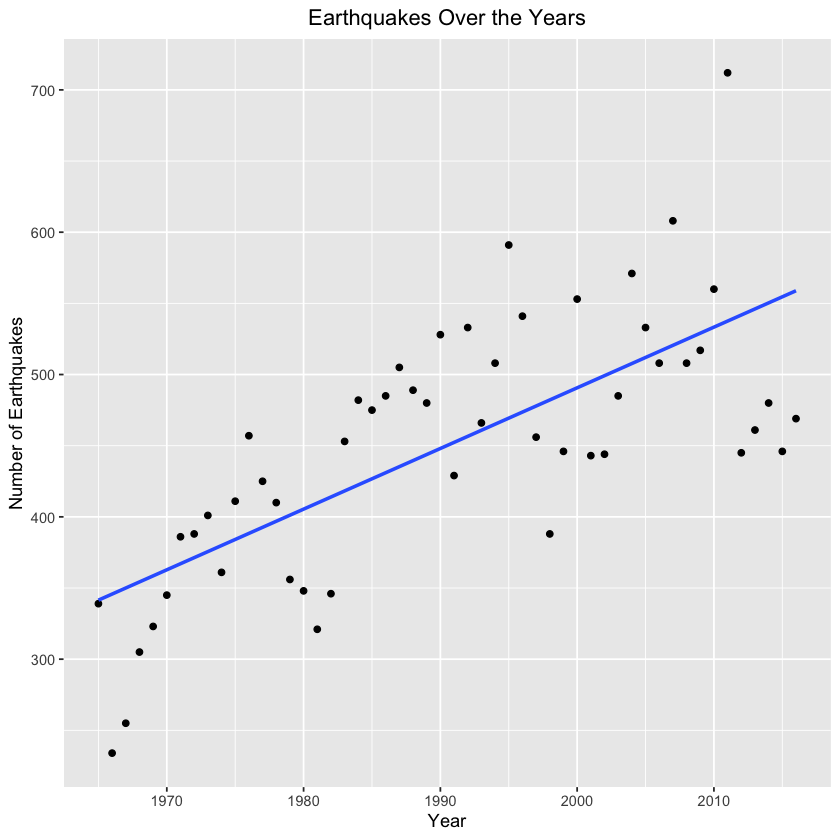

In [114]:
ggplot(earthquakeCountYears, aes(x = Year, y = count)) +
  ggtitle("Earthquakes Over the Years") +
  geom_point() +
  geom_smooth(method = "lm", se = FALSE) +
  scale_y_continuous("Number of Earthquakes") +
  theme(plot.title = element_text(hjust = 0.5))

---
##### Is the increase in earthquakes due to an increase in the number of seismometors over the years?
+ Station data from .txt file from http://www.iris.washington.edu/gmap/#network=_REALTIME&plates=on&planet=earth

In [119]:
StationXML <- read_delim("/Users/gonzalezfamily/Documents/GitHub/FinalProject2021/Data/gmap-stations.csv", 
                            "|", escape_double = FALSE, trim_ws = TRUE)


── Column specification ────────────────────────────────────────────────────────
cols(
  `#Network` = col_character(),
  Station = col_character(),
  Latitude = col_double(),
  Longitude = col_double(),
  Elevation = col_double(),
  Sitename = col_character(),
  StartTime = col_datetime(format = ""),
  EndTime = col_datetime(format = "")
)




##### Export to wrangle in Excel

In [123]:
write.xlsx(StationXML, "StationXML.xlsx")

##### Import back into R

In [124]:
StationXML1 <- read_excel("~/Desktop/Desktop Entity/DSO110 Final Group Project/Earthquakes/StationXML.xlsx")
View(StationXML1) 
str(StationXML1)

Column1,DataCenter,#Network,Station,Latitude,Longitude,Elevation,Sitename,StartTime,EndTime
<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dttm>,<dttm>
10,BATS,TW,YULB,23.39250,121.2971,376.1,Yuli,2000-02-15,2599-12-31 23:59:59
100,IRISDMC,2O,BTL08,-16.98692,134.4670,235.0,"Beetaloo Station, NT",2021-09-03,2025-12-31 00:00:00
1000,IRISDMC,CN,A11,47.24310,-70.1969,55.0,"St-Roch-Des-Aulnaies, QC, CA",1994-10-16,2599-12-31 23:59:59
1001,IRISDMC,CN,A16,47.46800,-70.0096,13.0,"Riviere Ouelle, QC, CA",1994-10-15,2599-12-31 23:59:59
1002,IRISDMC,CN,A21,47.70450,-69.6892,47.0,"St-Andre, QC, CA",1994-10-17,2599-12-31 23:59:59
1003,IRISDMC,CN,A54,47.45680,-70.4134,377.0,"Misere, QC, CA",1994-10-20,2599-12-31 23:59:59
1004,IRISDMC,CN,A61,47.69360,-70.0914,380.0,"Sainte Mathilde, QC, CA",1994-10-19,2599-12-31 23:59:59
1005,IRISDMC,CN,A64,47.82740,-69.8914,132.0,"Saint-Simeon, QC, CA",1994-10-19,2599-12-31 23:59:59
1006,IRISDMC,CN,ATKO,48.82310,-91.6004,382.7,"Atikokan Iron Mine, ON, CA",2004-06-09,2599-12-31 23:59:59


tibble[,10] [4,134 × 10] (S3: tbl_df/tbl/data.frame)
 $ Column1   : chr [1:4134] "10" "100" "1000" "1001" ...
 $ DataCenter: chr [1:4134] "BATS" "IRISDMC" "IRISDMC" "IRISDMC" ...
 $ #Network  : chr [1:4134] "TW" "2O" "CN" "CN" ...
 $ Station   : chr [1:4134] "YULB" "BTL08" "A11" "A16" ...
 $ Latitude  : num [1:4134] 23.4 -17 47.2 47.5 47.7 ...
 $ Longitude : num [1:4134] 121.3 134.5 -70.2 -70 -69.7 ...
 $ Elevation : num [1:4134] 376 235 55 13 47 ...
 $ Sitename  : chr [1:4134] "Yuli" "Beetaloo Station, NT" "St-Roch-Des-Aulnaies, QC, CA" "Riviere Ouelle, QC, CA" ...
 $ StartTime : POSIXct[1:4134], format: "2000-02-15 00:00:00" "2021-09-03 00:00:00" ...
 $ EndTime   : POSIXct[1:4134], format: "2599-12-31 23:59:59" "2025-12-31 00:00:00" ...


##### Separate Start Date Year from Date and Time

In [125]:
StationXML2 <- separate(StationXML1, StartTime, c("Date", "Time"), sep = " ")
StationXML3 <- separate(StationXML2, Date, c("Year Deployed", "Month", "Day"), sep = "-")
head(StationXML3)

Column1,DataCenter,#Network,Station,Latitude,Longitude,Elevation,Sitename,Year Deployed,Month,Day,Time,EndTime
<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dttm>
10,BATS,TW,YULB,23.39250,121.2971,376.1,Yuli,2000,02,15,00:00:00,2599-12-31 23:59:59
100,IRISDMC,2O,BTL08,-16.98692,134.4670,235.0,"Beetaloo Station, NT",2021,09,03,00:00:00,2025-12-31 00:00:00
1000,IRISDMC,CN,A11,47.24310,-70.1969,55.0,"St-Roch-Des-Aulnaies, QC, CA",1994,10,16,00:00:00,2599-12-31 23:59:59
1001,IRISDMC,CN,A16,47.46800,-70.0096,13.0,"Riviere Ouelle, QC, CA",1994,10,15,00:00:00,2599-12-31 23:59:59
1002,IRISDMC,CN,A21,47.70450,-69.6892,47.0,"St-Andre, QC, CA",1994,10,17,00:00:00,2599-12-31 23:59:59
1003,IRISDMC,CN,A54,47.45680,-70.4134,377.0,"Misere, QC, CA",1994,10,20,00:00:00,2599-12-31 23:59:59


##### Change Column Name

In [126]:
StationXML3$YearDeployed <- StationXML3$`Year Deployed`
StationYears <- StationXML3 %>% group_by(YearDeployed) %>% summarize(count = n())
head(StationYears)

YearDeployed,count
<chr>,<int>
1928,1
1932,3
1939,1
1959,1
1964,1
1965,1


##### Export to Excel again to combine info from tables that don't have a join
##### And then import after combining

In [128]:
write.xlsx(StationYears, "StationYears.xlsx")
write.xlsx(earthquakeCountYears, "earthquakeCountYears.xlsx")

In [135]:
earthquakeCountYearsStations <- read_excel("/Users/gonzalezfamily/Documents/GitHub/FinalProject2021/Data/earthquakeCountYears.xlsx")
head(earthquakeCountYearsStations)

Year,count,Stations,Increase
<dbl>,<dbl>,<dbl>,<dbl>
1965,339,8,1
1966,234,9,1
1967,255,10,0
1968,305,10,0
1969,323,10,0
1970,345,10,8


##### Plot Stations v. Earthquake Count

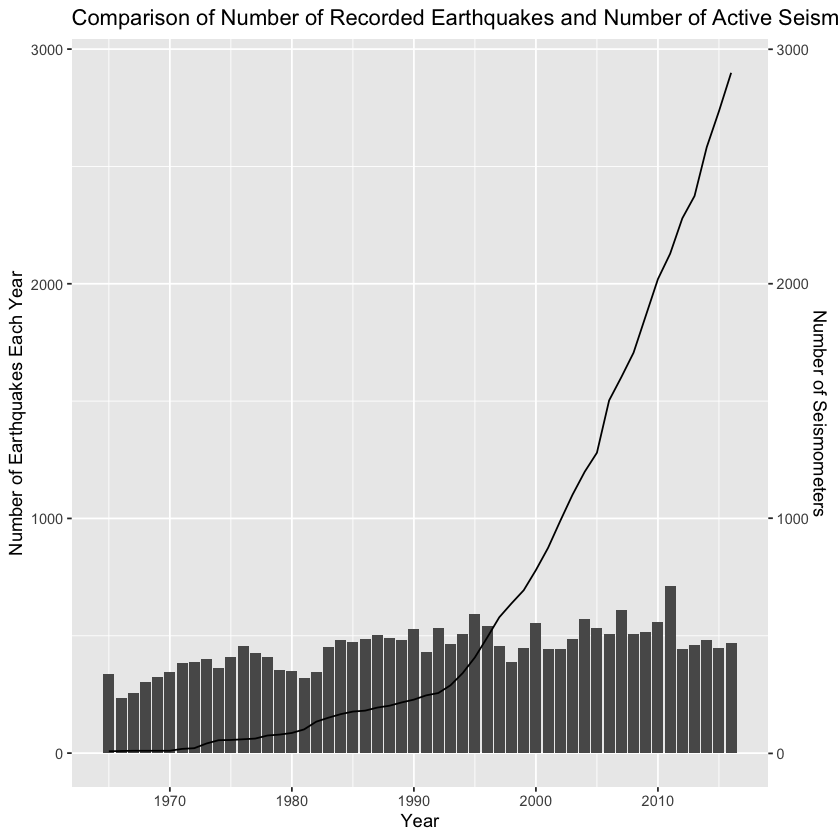

In [137]:
ggplot(earthquakeCountYearsStations) +
  ggtitle("Comparison of Number of Recorded Earthquakes and Number of Active Seismometers per Year") +
  geom_bar(aes( x = Year, y = count), stat = "identity") +
  geom_line(aes(x = Year, y = Stations), stat = "identity") +
  scale_y_continuous(name = "Number of Earthquakes Each Year", 
                     sec.axis = sec_axis(~., name = "Number of Seismometers") )



+ The amount of stations did increase drastically, but the increase doesn't appear to have a correlation with the amount of earthquakes.
+ Also, it is interesting to note the location of these stations.

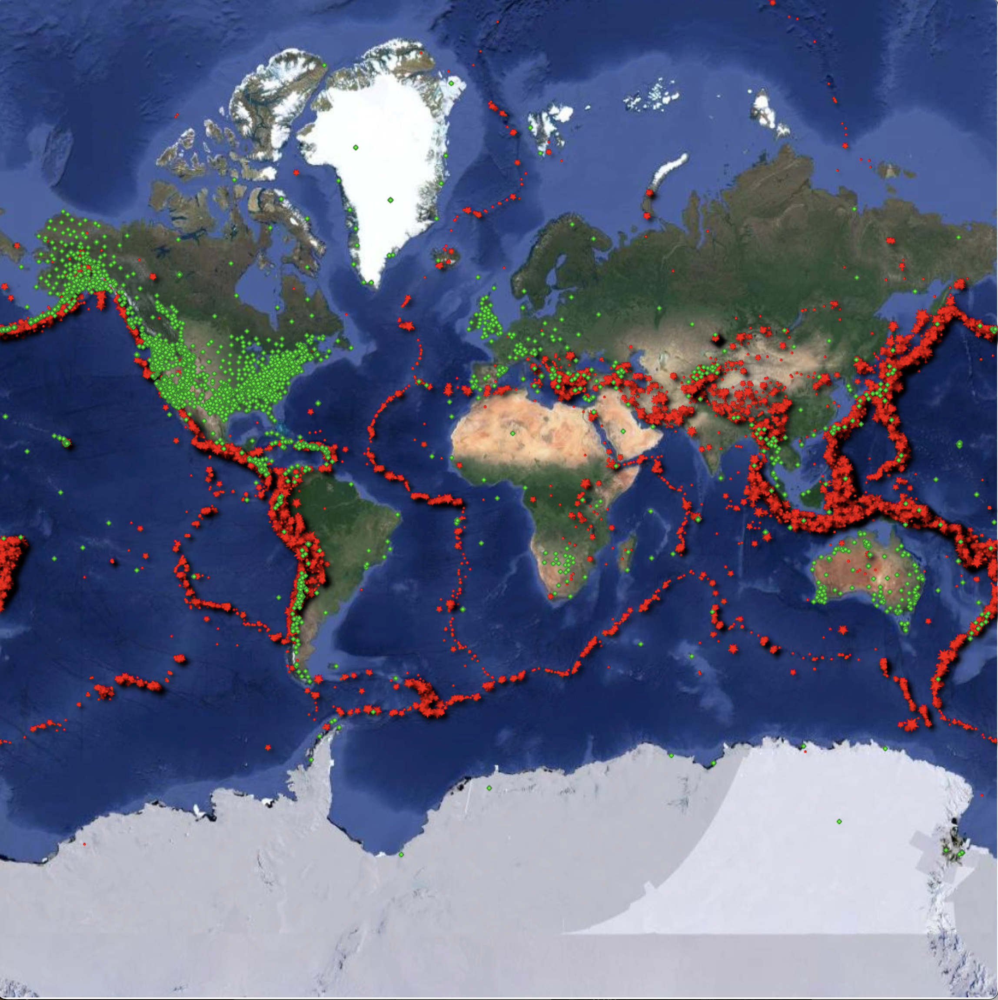

+ While most of the earthquakes appear to be in Southeast and East Asia and Oceana, the majority of the stations are located in the US.
+ The database that holds this information (IRIS) is based out of the US, but there did not appear to be any stations outside of their database (which might bias the information.)

---

#### Are certain types of plate boundaries more likely to have earthquakes?
+ Import data joined from QGIS
    + PlateBoundaries and earthquakes
    + QGIS was able to perform KNN taking earthquakes geopoints and joining PlateBoundaries lines (spaces between points)

In [143]:
EarthquakesToPlateInterface <- read.csv("/Users/gonzalezfamily/Documents/GitHub/FinalProject2021/Data/EarthquakesToPlateInterface.csv")
head(EarthquakesToPlateInterface)
str(EarthquakesToPlateInterface)

,field_1,Date,Time,Latitude,Longitude,Type,Depth,Magnitude,ID,MonthDay,⋯,join_begin,join_end,join_altitudeMode,join_tessellate,join_extrude,join_visibility,join_drawOrder,join_icon,join_snippet,distance
,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<chr>,⋯,<lgl>,<lgl>,<chr>,<int>,<int>,<int>,<lgl>,<lgl>,<lgl>,<dbl>
1,1,1965-01-02,13:44:18,19.246,145.616,Earthquake,131.6,6.0,ISCGEM860706,01/02,⋯,NA,NA,clampToGround,-1,0,-1,NA,NA,NA,1.8854980
2,2,1965-01-04,11:29:49,1.863,127.352,Earthquake,80.0,5.8,ISCGEM860737,01/04,⋯,NA,NA,clampToGround,-1,0,-1,NA,NA,NA,1.8877318
3,3,1965-01-05,18:05:58,-20.579,-173.972,Earthquake,20.0,6.2,ISCGEM860762,01/05,⋯,NA,NA,clampToGround,-1,0,-1,NA,NA,NA,0.5155921
4,4,1965-01-08,18:49:43,-59.076,-23.557,Earthquake,15.0,5.8,ISCGEM860856,01/08,⋯,NA,NA,clampToGround,-1,0,-1,NA,NA,NA,0.4608469
5,5,1965-01-09,13:32:50,11.938,126.427,Earthquake,15.0,5.8,ISCGEM860890,01/09,⋯,NA,NA,clampToGround,-1,0,-1,NA,NA,NA,0.3343100
6,6,1965-01-10,13:36:32,-13.405,166.629,Earthquake,35.0,6.7,ISCGEM860922,01/10,⋯,NA,NA,clampToGround,-1,0,-1,NA,NA,NA,0.5489016


'data.frame':	23412 obs. of  27 variables:
 $ field_1          : int  1 2 3 4 5 6 7 8 9 10 ...
 $ Date             : chr  "1965-01-02" "1965-01-04" "1965-01-05" "1965-01-08" ...
 $ Time             : chr  "13:44:18" "11:29:49" "18:05:58" "18:49:43" ...
 $ Latitude         : num  19.25 1.86 -20.58 -59.08 11.94 ...
 $ Longitude        : num  145.6 127.4 -174 -23.6 126.4 ...
 $ Type             : chr  "Earthquake" "Earthquake" "Earthquake" "Earthquake" ...
 $ Depth            : num  132 80 20 15 15 ...
 $ Magnitude        : num  6 5.8 6.2 5.8 5.8 6.7 5.9 6 6 5.8 ...
 $ ID               : chr  "ISCGEM860706" "ISCGEM860737" "ISCGEM860762" "ISCGEM860856" ...
 $ MonthDay         : chr  "01/02" "01/04" "01/05" "01/08" ...
 $ Hemisphere       : chr  "Tropics" "Tropics" "Tropics" "Southern" ...
 $ Season           : chr  "Tropical" "Tropical" "Tropical" "Summer" ...
 $ LandSea          : logi  TRUE TRUE TRUE TRUE TRUE TRUE ...
 $ TropicZone       : chr  "Tropic of Cancer" "Tropic of Cancer" "Tro

##### Separate out plate boundary type from 'join_description'

In [144]:
EarthquakesToPlateInterface2 <- separate(EarthquakesToPlateInterface, join_description, c("V1", "V2", "V3", "V4", "V5", "V6", "V7", "V8", "V9", "V10", "V11", "V12", "V13", "V14", "V15", "V16", "V17", "V18", "V19", "V20", "V21", "V22", "V23", "V24", "V25", "V26", "V27", "V28", "V29", "V30", "V31", "V32", "V33"), sep = "<")
head(EarthquakesToPlateInterface2)

,field_1,Date,Time,Latitude,Longitude,Type,Depth,Magnitude,ID,MonthDay,⋯,join_begin,join_end,join_altitudeMode,join_tessellate,join_extrude,join_visibility,join_drawOrder,join_icon,join_snippet,distance
,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<chr>,⋯,<lgl>,<lgl>,<chr>,<int>,<int>,<int>,<lgl>,<lgl>,<lgl>,<dbl>
1,1,1965-01-02,13:44:18,19.246,145.616,Earthquake,131.6,6.0,ISCGEM860706,01/02,⋯,NA,NA,clampToGround,-1,0,-1,NA,NA,NA,1.8854980
2,2,1965-01-04,11:29:49,1.863,127.352,Earthquake,80.0,5.8,ISCGEM860737,01/04,⋯,NA,NA,clampToGround,-1,0,-1,NA,NA,NA,1.8877318
3,3,1965-01-05,18:05:58,-20.579,-173.972,Earthquake,20.0,6.2,ISCGEM860762,01/05,⋯,NA,NA,clampToGround,-1,0,-1,NA,NA,NA,0.5155921
4,4,1965-01-08,18:49:43,-59.076,-23.557,Earthquake,15.0,5.8,ISCGEM860856,01/08,⋯,NA,NA,clampToGround,-1,0,-1,NA,NA,NA,0.4608469
5,5,1965-01-09,13:32:50,11.938,126.427,Earthquake,15.0,5.8,ISCGEM860890,01/09,⋯,NA,NA,clampToGround,-1,0,-1,NA,NA,NA,0.3343100
6,6,1965-01-10,13:36:32,-13.405,166.629,Earthquake,35.0,6.7,ISCGEM860922,01/10,⋯,NA,NA,clampToGround,-1,0,-1,NA,NA,NA,0.5489016


##### Remove unnecessary data

In [146]:
EarthquakesToPlateInterface3 = subset(EarthquakesToPlateInterface2, select = -c(V1, V2, V3, V4, V5, V6, V7, V8, V9, V10, V11, V12, V13, V14, V15, V16, V17, V18, V19, V20, V21, V22, V23, V24, V26, V27, V28, V29, V30, V31, V32, V33))
head(EarthquakesToPlateInterface3)

,field_1,Date,Time,Latitude,Longitude,Type,Depth,Magnitude,ID,MonthDay,⋯,join_begin,join_end,join_altitudeMode,join_tessellate,join_extrude,join_visibility,join_drawOrder,join_icon,join_snippet,distance
,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<chr>,⋯,<lgl>,<lgl>,<chr>,<int>,<int>,<int>,<lgl>,<lgl>,<lgl>,<dbl>
1,1,1965-01-02,13:44:18,19.246,145.616,Earthquake,131.6,6.0,ISCGEM860706,01/02,⋯,NA,NA,clampToGround,-1,0,-1,NA,NA,NA,1.8854980
2,2,1965-01-04,11:29:49,1.863,127.352,Earthquake,80.0,5.8,ISCGEM860737,01/04,⋯,NA,NA,clampToGround,-1,0,-1,NA,NA,NA,1.8877318
3,3,1965-01-05,18:05:58,-20.579,-173.972,Earthquake,20.0,6.2,ISCGEM860762,01/05,⋯,NA,NA,clampToGround,-1,0,-1,NA,NA,NA,0.5155921
4,4,1965-01-08,18:49:43,-59.076,-23.557,Earthquake,15.0,5.8,ISCGEM860856,01/08,⋯,NA,NA,clampToGround,-1,0,-1,NA,NA,NA,0.4608469
5,5,1965-01-09,13:32:50,11.938,126.427,Earthquake,15.0,5.8,ISCGEM860890,01/09,⋯,NA,NA,clampToGround,-1,0,-1,NA,NA,NA,0.3343100
6,6,1965-01-10,13:36:32,-13.405,166.629,Earthquake,35.0,6.7,ISCGEM860922,01/10,⋯,NA,NA,clampToGround,-1,0,-1,NA,NA,NA,0.5489016


##### Separate out V25 by ">"

In [147]:
EarthquakesToPlateInterface4 <- separate(EarthquakesToPlateInterface3, V25, c("delete", "PlateBoundaryType"), sep = ">")
head(EarthquakesToPlateInterface4)

,field_1,Date,Time,Latitude,Longitude,Type,Depth,Magnitude,ID,MonthDay,⋯,join_begin,join_end,join_altitudeMode,join_tessellate,join_extrude,join_visibility,join_drawOrder,join_icon,join_snippet,distance
,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<chr>,⋯,<lgl>,<lgl>,<chr>,<int>,<int>,<int>,<lgl>,<lgl>,<lgl>,<dbl>
1,1,1965-01-02,13:44:18,19.246,145.616,Earthquake,131.6,6.0,ISCGEM860706,01/02,⋯,NA,NA,clampToGround,-1,0,-1,NA,NA,NA,1.8854980
2,2,1965-01-04,11:29:49,1.863,127.352,Earthquake,80.0,5.8,ISCGEM860737,01/04,⋯,NA,NA,clampToGround,-1,0,-1,NA,NA,NA,1.8877318
3,3,1965-01-05,18:05:58,-20.579,-173.972,Earthquake,20.0,6.2,ISCGEM860762,01/05,⋯,NA,NA,clampToGround,-1,0,-1,NA,NA,NA,0.5155921
4,4,1965-01-08,18:49:43,-59.076,-23.557,Earthquake,15.0,5.8,ISCGEM860856,01/08,⋯,NA,NA,clampToGround,-1,0,-1,NA,NA,NA,0.4608469
5,5,1965-01-09,13:32:50,11.938,126.427,Earthquake,15.0,5.8,ISCGEM860890,01/09,⋯,NA,NA,clampToGround,-1,0,-1,NA,NA,NA,0.3343100
6,6,1965-01-10,13:36:32,-13.405,166.629,Earthquake,35.0,6.7,ISCGEM860922,01/10,⋯,NA,NA,clampToGround,-1,0,-1,NA,NA,NA,0.5489016


##### Group by PlateBoundaryType

In [150]:
EarthquakesOnEachPlateBoundaryType <- EarthquakesToPlateInterface4 %>% group_by(PlateBoundaryType) %>% summarize(count = n())
names(EarthquakesOnEachPlateBoundaryType)[names(EarthquakesOnEachPlateBoundaryType) == "count"] <- "NumberOfEarthquakes"
View(EarthquakesOnEachPlateBoundaryType)

PlateBoundaryType,NumberOfEarthquakes
<chr>,<int>
Convergent Boundary,17356
Divergent Boundary,1461
Other,981
Transform Boundary,3614


##### Compare to distance of boundaries of each type

In [151]:
BoundaryDistanceByType <- BoundaryDistance %>% group_by(PlateBoundaryType) %>% summarize(TotalPlateBoundaryDistanceKM = sum(DistanceKM))
PlateBoundaryComparison <- merge(EarthquakesOnEachPlateBoundaryType, BoundaryDistanceByType, by = "PlateBoundaryType")
View(PlateBoundaryComparison)

PlateBoundaryType,NumberOfEarthquakes,TotalPlateBoundaryDistanceKM
<chr>,<int>,<dbl>
Convergent Boundary,17356,62698.63
Divergent Boundary,1461,61859.67
Other,981,13163.88
Transform Boundary,3614,51885.98


In [154]:
PlateBoundaryComparison$earthquakePercentage <- PlateBoundaryComparison$NumberOfEarthquakes/sum(PlateBoundaryComparison$NumberOfEarthquakes)
print(PlateBoundaryComparison)

    PlateBoundaryType NumberOfEarthquakes TotalPlateBoundaryDistanceKM
1 Convergent Boundary               17356                     62698.63
2  Divergent Boundary                1461                     61859.67
3               Other                 981                     13163.88
4  Transform Boundary                3614                     51885.98
  PercentofWhole earthquakePercentage
1     0.33067474           0.74132923
2     0.32625002           0.06240390
3     0.06942677           0.04190159
4     0.27364847           0.15436528


##### Calculate Percentage for ChiSquare

In [152]:
PlateBoundaryComparison$PercentofWhole <- PlateBoundaryComparison$TotalPlateBoundaryDistanceKM/sum(PlateBoundaryComparison$TotalPlateBoundaryDistanceKM)

In [153]:
observedPlateType = c(17356, 1461, 981, 3614)
expectedPlateType = c(0.33, 0.33, 0.07, 0.27)
chisq.test( x = observedPlateType, p = expectedPlateType)


	Chi-squared test for given probabilities

data:  observedPlateType
X-squared = 18507, df = 3, p-value < 2.2e-16


+ p-value < 0.05 indicates that the rates do not line up as expected with significant difference.
